# Install MMSegmentation

In [ ]:
!nvidia-smi # Tesla P100이 출력되지 않으면 "런타임 초기화"

Mon Jun  6 20:06:43 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   37C    P0    29W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())

1.11.0+cu113 True


In [ ]:
# Install MMCV
!pip install mmcv-full -f https://download.openmmlab.com/mmcv/dist/cu111/torch1.10.0/index.html

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://download.openmmlab.com/mmcv/dist/cu111/torch1.10.0/index.html
     |████████████████████████████████| 46.4 MB 5.8 MB/s 
     |████████████████████████████████| 190 kB 8.0 MB/s 


In [ ]:
!rm -rf mmsegmentation
!git clone https://github.com/museonghwang/mmsegmentation.git
#!git clone https://github.com/open-mmlab/mmsegmentation.git 
%cd mmsegmentation
!pip install -e .

Cloning into 'mmsegmentation'...
remote: Enumerating objects: 7003, done.
remote: Total 7003 (delta 0), reused 0 (delta 0), pack-reused 7003
Receiving objects: 100% (7003/7003), 12.82 MiB | 23.62 MiB/s, done.
Resolving deltas: 100% (5191/5191), done.
/content/mmsegmentation
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Obtaining file:///content/mmsegmentation
     |████████████████████████████████| 577 kB 7.1 MB/s 
     |████████████████████████████████| 631 kB 55.3 MB/s 
  Created wheel for imgaug: filename=imgaug-0.2.6-py3-none-any.whl size=654017 sha256=0ed254c9e2396e51698f3430464cc8e48b61f1d5a31a5a4b3af6abe631bc18ec
  Stored in directory: /root/.cache/pip/wheels/89/72/98/3ebfdba1069a9a8eaaa7ae7265cfd67d63ef0197aaee2e5f9c
Successfully built imgaug
  Attempting uninstall: imgaug
    Found existing installation: imgaug 0.2.9
    Uninstalling imgaug-0.2.9:
      Successfully uninstalled imgaug-0.2.9
  Running setup.py develop for mms

In [ ]:
# 런타임 -> 런타임 "다시 시작" 후 아래 수행. 
# Check Pytorch installation
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())

# Check MMSegmentation installation
import mmseg
print(mmseg.__version__)

1.11.0+cu113 True
0.24.1


# Run Inference with MMSeg trained weight

In [ ]:
%cd mmsegmentation
!mkdir checkpoints
!wget https://download.openmmlab.com/mmsegmentation/v0.5/hrnet/fcn_hr48_512x512_160k_ade20k/fcn_hr48_512x512_160k_ade20k_20200614_214407-a52fc02c.pth -P checkpoints

/content/mmsegmentation
--2022-06-02 16:13:34--  https://download.openmmlab.com/mmsegmentation/v0.5/hrnet/fcn_hr48_512x512_160k_ade20k/fcn_hr48_512x512_160k_ade20k_20200614_214407-a52fc02c.pth
Resolving download.openmmlab.com (download.openmmlab.com)... 47.252.96.28
Connecting to download.openmmlab.com (download.openmmlab.com)|47.252.96.28|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 264512327 (252M) [application/octet-stream]
Saving to: ‘checkpoints/fcn_hr48_512x512_160k_ade20k_20200614_214407-a52fc02c.pth’

fcn_hr48_512x512_16 100%[===================>] 252.26M  8.32MB/s    in 32s     

2022-06-02 16:14:08 (7.97 MB/s) - ‘checkpoints/fcn_hr48_512x512_160k_ade20k_20200614_214407-a52fc02c.pth’ saved [264512327/264512327]



In [ ]:
from mmseg.apis import inference_segmentor, init_segmentor, show_result_pyplot
from mmseg.core.evaluation import get_palette

In [ ]:
config_file = '/content/mmsegmentation/configs/hrnet/fcn_hr48_512x512_160k_ade20k.py'
checkpoint_file = '/content/mmsegmentation/checkpoints/fcn_hr48_512x512_160k_ade20k_20200614_214407-a52fc02c.pth'

In [ ]:
# build the model from a config file and a checkpoint file
model = init_segmentor(config_file, checkpoint_file, device='cuda:0')

/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '


load checkpoint from local path: /content/mmsegmentation/checkpoints/fcn_hr48_512x512_160k_ade20k_20200614_214407-a52fc02c.pth


In [ ]:
# test a single image
img = '/content/mmsegmentation/demo/demo.png'
result = inference_segmentor(model, img)

/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


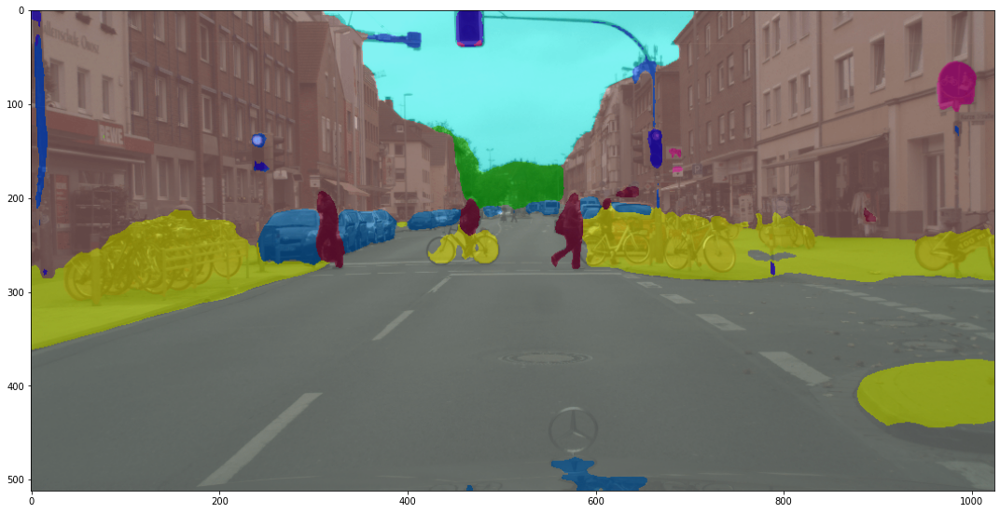

In [ ]:
# show the results
show_result_pyplot(model, img, result, get_palette('ade20k'))

## Train a semantic segmentation model on a new dataset

To train on a customized dataset, the following steps are necessary. 
1. Add a new dataset class. 
2. Create a config file accordingly. 
3. Perform training and evaluation. 

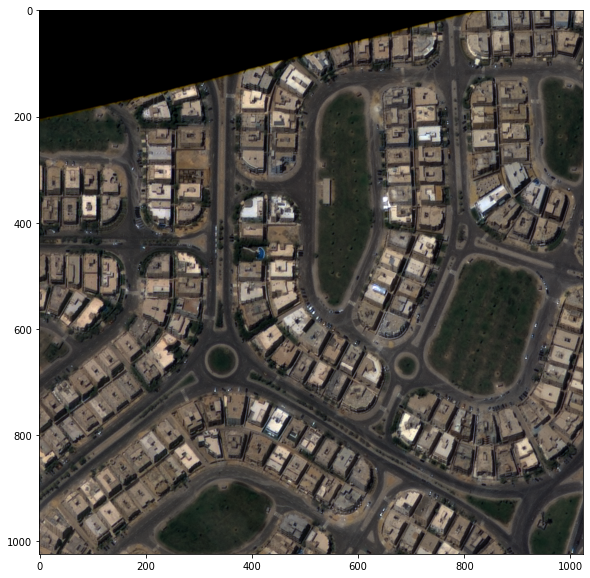

In [ ]:
# Let's take a look at the dataset
import mmcv
import matplotlib.pyplot as plt

img = mmcv.imread('/content/drive/Shareddrives/msmg/level1/dataset/train/building/image/BLD00001_PS3_K3A_NIA0276.png')
plt.figure(figsize=(10, 10))
plt.imshow(mmcv.bgr2rgb(img))
plt.show()

In [ ]:
import os.path as osp
import numpy as np
from PIL import Image
import cv2

# convert dataset annotation to semantic segmentation map
data_root = '/content/drive/Shareddrives/msmg/level1/dataset/train/building'
img_dir = 'image'
ann_dir = 'annotation'

# define class and plaette for better visualization
classes = ('background', 'building')
palette = [[0, 0, 0], [0, 0, 255]]

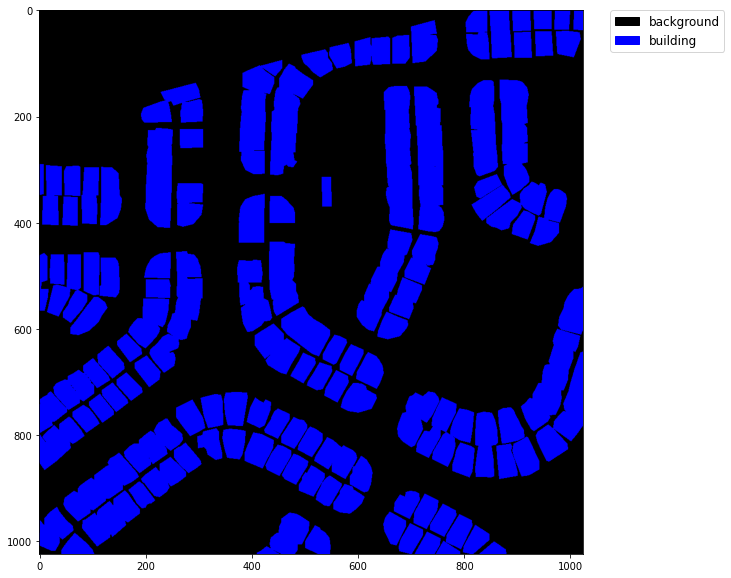

In [ ]:
# Let's take a look at the segmentation map we got
import matplotlib.patches as mpatches

img = Image.open('/content/drive/Shareddrives/msmg/level1/dataset/train/building/annotation/BLD00001_PS3_K3A_NIA0276.png')
plt.figure(figsize=(10, 10))
im = plt.imshow(np.array(img.convert('RGB')))

# create a patch (proxy artist) for every color 
patches = [mpatches.Patch(color=np.array(palette[i])/255., label=classes[i]) for i in range(2)]

# put those patched as legend-handles into the legend
plt.legend(handles=patches, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize='large')

plt.show()

# Create a config file
In the next step, we need to modify the config for the training. To accelerate the process, we finetune the model from trained weights.

In [ ]:
config_file = '/content/mmsegmentation/configs/hrnet/fcn_hr48_512x512_160k_ade20k.py'
checkpoint_file = '/content/mmsegmentation/checkpoints/fcn_hr48_512x512_160k_ade20k_20200614_214407-a52fc02c.pth'
save_pth_path = '/content/drive/Shareddrives/msmg/loss test/bjh/class_ratio/building_hrnet_no10_iter10000_ratio95_checkpoint'

In [ ]:
# convert dataset annotation to semantic segmentation map
data_root = '/content/drive/Shareddrives/msmg/level1/dataset/train/building'
img_dir = 'image'
ann_dir = 'annotation'

# define class and plaette for better visualization
classes = ('background', 'building')
palette = [[0, 0, 0], [0, 0, 255]]

In [ ]:
from mmseg.datasets.builder import DATASETS
from mmseg.datasets.custom import CustomDataset

@DATASETS.register_module(force=True)
class BuildingSemanticSegmentation(CustomDataset):
    CLASSES = classes
    PALETTE = palette
    def __init__(self, split, **kwargs):
        super().__init__(img_suffix='.png', seg_map_suffix='.png', split=split, **kwargs)
        assert osp.exists(self.img_dir) and self.split is not None

In [ ]:
from mmcv import Config

cfg = Config.fromfile(config_file)

In [ ]:
from mmseg.apis import set_random_seed

# add CLASSES and PALETTE to checkpoint
cfg.checkpoint_config.meta = dict(
    CLASSES=classes,
    PALETTE=palette)

# Since we use only one GPU, BN is used instead of SyncBN
cfg.norm_cfg = dict(type='BN', requires_grad=True)
#cfg.model.backbone.norm_cfg = cfg.norm_cfg
cfg.model.decode_head.norm_cfg = cfg.norm_cfg
cfg.model.backbone.norm_cfg = cfg.norm_cfg
# modify num classes of the model in decode/auxiliary head
cfg.model.decode_head.num_classes = 2

# modify loss function crossentropy
# cfg.model.decode_head.loss_decode= [dict(type='CrossEntropyLoss', class_weight=[0.5, 1.0], loss_name='loss_ce', loss_weight=0.8),
# 																		dict(type='LovaszLoss', loss_type='multi_class', classes='all', per_image=True, reduction='mean', class_weight=[0.5, 1.0], loss_name='loss_lovasz', loss_weight=0.2)]

# Modify dataset type and path
cfg.dataset_type = 'BuildingSemanticSegmentation'
cfg.data_root = data_root

cfg.data.samples_per_gpu = 8
cfg.data.workers_per_gpu = 8

# Albumentations transforms settings
albu_train_transforms = [
    dict(
    type='OneOf',
    transforms=[
        dict(type='RandomRotate90', p=1.0)
    ], p=0.5),

    dict(
    type='OneOf',
    transforms=[
        dict(type='RandomBrightnessContrast',brightness_limit=0.1, contrast_limit=0.15, p=1.0),
        dict(type='CLAHE', clip_limit=4.0, tile_grid_size=(8, 8), always_apply=False, p=1.0),
        dict(type='HueSaturationValue', hue_shift_limit=15, sat_shift_limit=25, val_shift_limit=10, p=1.0),
    ], p=0.5)
]

# pipline
cfg.img_norm_cfg = dict(
    mean=[123.675, 116.28, 103.53], std=[58.395, 57.12, 57.375], to_rgb=True)
cfg.crop_size = (512, 512)
cfg.train_pipeline = [
    dict(type='LoadImageFromFile'),
    dict(type='LoadAnnotations'),
    dict(type='Resize', img_scale=(1024, 1024), ratio_range=(0.5, 1.5)),
    dict(type='RandomCrop', crop_size=cfg.crop_size, cat_max_ratio=0.75),
    dict(type='RandomFlip', flip_ratio=0.5),
    # dict(
    #     type='Albu',
    #     transforms=albu_train_transforms,
    #     keymap=dict(img='image', gt_semantic_seg='mask'),
    #     update_pad_shape=True,
    #     ),
    dict(type='PhotoMetricDistortion'),
    dict(type='Normalize', **cfg.img_norm_cfg),
    dict(type='Pad', size=cfg.crop_size, pad_val=0, seg_pad_val=255),
    dict(type='DefaultFormatBundle'),
    dict(type='Collect', keys=['img', 'gt_semantic_seg']),
]

cfg.test_pipeline = [
    dict(type='LoadImageFromFile'),
    dict(
        type='MultiScaleFlipAug',
        img_scale=(1024, 1024),
        # img_ratios=[0.5, 0.75, 1.0, 1.25, 1.5, 1.75],
        flip=False,
        transforms=[
            dict(type='Resize', keep_ratio=True),
            dict(type='RandomFlip'),
            dict(type='Normalize', **cfg.img_norm_cfg),
            dict(type='ImageToTensor', keys=['img']),
            dict(type='Collect', keys=['img']),
        ])
]

cfg.data.train.type = cfg.dataset_type
cfg.data.train.data_root = '/content/drive/Shareddrives/msmg/level1/dataset/train/building/'
cfg.data.train.img_dir = 'image'
cfg.data.train.ann_dir = 'annotation'
cfg.data.train.pipeline = cfg.train_pipeline
cfg.data.train.split = 'split/train_ratio95.txt'

cfg.data.val.type = cfg.dataset_type
cfg.data.val.data_root = '/content/drive/Shareddrives/msmg/level1/dataset/validation/building/'
cfg.data.val.img_dir = 'image'
cfg.data.val.ann_dir = 'annotation'
cfg.data.val.pipeline = cfg.test_pipeline
cfg.data.val.split = 'split/validation.txt'

cfg.data.test.type = cfg.dataset_type
cfg.data.test.data_root = '/content/drive/Shareddrives/msmg/level1/dataset/validation/building/'
cfg.data.test.img_dir = 'image'
cfg.data.test.ann_dir = 'annotation'
cfg.data.test.pipeline = cfg.test_pipeline
cfg.data.test.split = 'split/validation.txt'

# We can still use the pre-trained Mask RCNN model though we do not need to
# use the mask branch
cfg.load_from = checkpoint_file

# Set up working dir to save files and logs.
cfg.work_dir = save_pth_path

cfg.runner.max_iters = 10000
cfg.log_config.interval = 10
cfg.evaluation.interval = 100
cfg.evaluation.save_best = 'mIoU'
cfg.checkpoint_config.interval = 2000

# Set seed to facitate reproducing the result
cfg.seed = 0
set_random_seed(0, deterministic=False)
cfg.gpu_ids = range(1)

# We can also use tensorboard to log the training process
cfg.log_config.hooks = [
    dict(type='TextLoggerHook'),
    dict(type='TensorboardLoggerHook')]

# Let's have a look at the final config used for training
print(f'Config:\n{cfg.pretty_text}')

Config:
norm_cfg = dict(type='BN', requires_grad=True)
model = dict(
    type='EncoderDecoder',
    pretrained='open-mmlab://msra/hrnetv2_w48',
    backbone=dict(
        type='HRNet',
        norm_cfg=dict(type='BN', requires_grad=True),
        norm_eval=False,
        extra=dict(
            stage1=dict(
                num_modules=1,
                num_branches=1,
                block='BOTTLENECK',
                num_blocks=(4, ),
                num_channels=(64, )),
            stage2=dict(
                num_modules=1,
                num_branches=2,
                block='BASIC',
                num_blocks=(4, 4),
                num_channels=(48, 96)),
            stage3=dict(
                num_modules=4,
                num_branches=3,
                block='BASIC',
                num_blocks=(4, 4, 4),
                num_channels=(48, 96, 192)),
            stage4=dict(
                num_modules=3,
                num_branches=4,
                block='BASIC',
     

# Train and Evaluation

In [ ]:
from mmseg.datasets import build_dataset
from mmseg.models import build_segmentor
from mmseg.apis import train_segmentor

# Build the dataset
datasets = [build_dataset(cfg.data.train)]

2022-06-02 16:14:40,304 - mmseg - INFO - Loaded 918 images


In [ ]:
# Build the detector
model = build_segmentor(
    cfg.model, train_cfg=cfg.get('train_cfg'), test_cfg=cfg.get('test_cfg'))

# Add an attribute for visualization convenience
model.CLASSES = datasets[0].CLASSES

/content/mmsegmentation/mmseg/models/backbones/hrnet.py:318: UserWarning: DeprecationWarning: pretrained is deprecated, please use "init_cfg" instead
  warnings.warn('DeprecationWarning: pretrained is deprecated, '
/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '


In [ ]:
# Create work_dir
mmcv.mkdir_or_exist(osp.abspath(cfg.work_dir))
train_segmentor(model, datasets, cfg, distributed=False, validate=True, meta=dict())

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:490: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))
2022-06-02 16:14:43,255 - mmseg - INFO - Loaded 159 images
2022-06-02 16:14:43,260 - mmseg - INFO - load checkpoint from local path: /content/mmsegmentation/checkpoints/fcn_hr48_512x512_160k_ade20k_20200614_214407-a52fc02c.pth
2022-06-02 16:14:43,951 - mmseg - WARNING - The model and loaded state dict do not match exactly

size mismatch for decode_head.conv_seg.weight: copying a param with shape torch.Size([150, 720, 1, 1]) from checkpoint, the shape in current model is torch.Size([2, 720, 1, 1]).
size mismatch for decode_head.conv_seg.bi

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 1.8 task/s, elapsed: 87s, ETA:     0s

2022-06-02 16:19:04,755 - mmseg - INFO - per class results:
2022-06-02 16:19:04,758 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 89.03 | 95.08 |
|  building  | 71.43 | 81.17 |
+------------+-------+-------+
2022-06-02 16:19:04,761 - mmseg - INFO - Summary:
2022-06-02 16:19:04,765 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 91.39 | 80.23 | 88.12 |
+-------+-------+-------+
2022-06-02 16:19:09,283 - mmseg - INFO - Now best checkpoint is saved as best_mIoU_iter_100.pth.
2022-06-02 16:19:09,286 - mmseg - INFO - Best mIoU is 0.8023 at 100 iter.
2022-06-02 16:19:09,292 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9139, mIoU: 0.8023, mAcc: 0.8812, IoU.background: 0.8903, IoU.building: 0.7143, Acc.background: 0.9508, Acc.building: 0.8117
2022-06-02 16:19:24,921 - mmseg - INFO - Iter [110/10000]	lr: 9.903e-03, eta: 6:56:14, time: 10.750, data_time: 9.197, memory: 10

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.6 task/s, elapsed: 35s, ETA:     0s

2022-06-02 16:22:26,911 - mmseg - INFO - per class results:
2022-06-02 16:22:26,913 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.12 | 95.13 |
|  building  | 74.54 | 84.61 |
+------------+-------+-------+
2022-06-02 16:22:26,916 - mmseg - INFO - Summary:
2022-06-02 16:22:26,920 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.34 | 82.33 | 89.87 |
+-------+-------+-------+
2022-06-02 16:22:26,932 - mmseg - INFO - The previous best checkpoint /content/drive/Shareddrives/msmg/loss test/bjh/class_ratio/building_hrnet_no10_iter10000_ratio95_checkpoint/best_mIoU_iter_100.pth was removed
2022-06-02 16:22:31,808 - mmseg - INFO - Now best checkpoint is saved as best_mIoU_iter_200.pth.
2022-06-02 16:22:31,810 - mmseg - INFO - Best mIoU is 0.8233 at 200 iter.
2022-06-02 16:22:31,819 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9234, mIoU: 0.8233, mAcc: 0.8987, IoU.bac

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.6 task/s, elapsed: 35s, ETA:     0s

2022-06-02 16:25:49,141 - mmseg - INFO - per class results:
2022-06-02 16:25:49,145 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.82 | 96.23 |
|  building  | 75.59 | 83.48 |
+------------+-------+-------+
2022-06-02 16:25:49,146 - mmseg - INFO - Summary:
2022-06-02 16:25:49,150 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.85 | 83.21 | 89.86 |
+-------+-------+-------+
2022-06-02 16:25:49,169 - mmseg - INFO - The previous best checkpoint /content/drive/Shareddrives/msmg/loss test/bjh/class_ratio/building_hrnet_no10_iter10000_ratio95_checkpoint/best_mIoU_iter_200.pth was removed
2022-06-02 16:25:53,499 - mmseg - INFO - Now best checkpoint is saved as best_mIoU_iter_300.pth.
2022-06-02 16:25:53,504 - mmseg - INFO - Best mIoU is 0.8321 at 300 iter.
2022-06-02 16:25:53,510 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9285, mIoU: 0.8321, mAcc: 0.8986, IoU.bac

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.5 task/s, elapsed: 35s, ETA:     0s

2022-06-02 16:29:11,561 - mmseg - INFO - per class results:
2022-06-02 16:29:11,564 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.11 | 95.54 |
|  building  | 77.02 | 86.55 |
+------------+-------+-------+
2022-06-02 16:29:11,568 - mmseg - INFO - Summary:
2022-06-02 16:29:11,572 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.15 | 84.07 | 91.04 |
+-------+-------+-------+
2022-06-02 16:29:11,587 - mmseg - INFO - The previous best checkpoint /content/drive/Shareddrives/msmg/loss test/bjh/class_ratio/building_hrnet_no10_iter10000_ratio95_checkpoint/best_mIoU_iter_300.pth was removed
2022-06-02 16:29:16,007 - mmseg - INFO - Now best checkpoint is saved as best_mIoU_iter_400.pth.
2022-06-02 16:29:16,055 - mmseg - INFO - Best mIoU is 0.8407 at 400 iter.
2022-06-02 16:29:16,058 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9315, mIoU: 0.8407, mAcc: 0.9104, IoU.bac

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.4 task/s, elapsed: 36s, ETA:     0s

2022-06-02 16:32:35,632 - mmseg - INFO - per class results:
2022-06-02 16:32:35,636 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.96 | 94.76 |
|  building  |  77.2 | 88.41 |
+------------+-------+-------+
2022-06-02 16:32:35,638 - mmseg - INFO - Summary:
2022-06-02 16:32:35,640 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.08 | 84.08 | 91.58 |
+-------+-------+-------+
2022-06-02 16:32:35,653 - mmseg - INFO - The previous best checkpoint /content/drive/Shareddrives/msmg/loss test/bjh/class_ratio/building_hrnet_no10_iter10000_ratio95_checkpoint/best_mIoU_iter_400.pth was removed
2022-06-02 16:32:40,659 - mmseg - INFO - Now best checkpoint is saved as best_mIoU_iter_500.pth.
2022-06-02 16:32:40,661 - mmseg - INFO - Best mIoU is 0.8408 at 500 iter.
2022-06-02 16:32:40,668 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9308, mIoU: 0.8408, mAcc: 0.9158, IoU.bac

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.5 task/s, elapsed: 35s, ETA:     0s

2022-06-02 16:35:58,962 - mmseg - INFO - per class results:
2022-06-02 16:35:58,964 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background |  88.5 | 91.96 |
|  building  | 72.92 | 89.16 |
+------------+-------+-------+
2022-06-02 16:35:58,968 - mmseg - INFO - Summary:
2022-06-02 16:35:58,972 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 91.22 | 80.71 | 90.56 |
+-------+-------+-------+
2022-06-02 16:35:58,976 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9122, mIoU: 0.8071, mAcc: 0.9056, IoU.background: 0.8850, IoU.building: 0.7292, Acc.background: 0.9196, Acc.building: 0.8916
2022-06-02 16:36:14,514 - mmseg - INFO - Iter [610/10000]	lr: 9.456e-03, eta: 5:30:16, time: 5.078, data_time: 3.538, memory: 10893, decode.loss_ce: 0.2272, decode.acc_seg: 90.6524, loss: 0.2272
2022-06-02 16:36:30,055 - mmseg - INFO - Iter [620/10000]	lr: 9.447e-03, eta: 5:28:31, time: 1.554, data_

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.5 task/s, elapsed: 35s, ETA:     0s

2022-06-02 16:39:17,207 - mmseg - INFO - per class results:
2022-06-02 16:39:17,209 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 89.99 | 92.63 |
|  building  |  76.3 | 91.87 |
+------------+-------+-------+
2022-06-02 16:39:17,213 - mmseg - INFO - Summary:
2022-06-02 16:39:17,218 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.43 | 83.14 | 92.25 |
+-------+-------+-------+
2022-06-02 16:39:17,222 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9243, mIoU: 0.8314, mAcc: 0.9225, IoU.background: 0.8999, IoU.building: 0.7630, Acc.background: 0.9263, Acc.building: 0.9187
2022-06-02 16:39:32,765 - mmseg - INFO - Iter [710/10000]	lr: 9.366e-03, eta: 5:23:58, time: 5.071, data_time: 3.530, memory: 10893, decode.loss_ce: 0.2049, decode.acc_seg: 91.1258, loss: 0.2049
2022-06-02 16:39:48,280 - mmseg - INFO - Iter [720/10000]	lr: 9.357e-03, eta: 5:22:27, time: 1.551, data_

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.3 task/s, elapsed: 37s, ETA:     0s

2022-06-02 16:42:37,572 - mmseg - INFO - per class results:
2022-06-02 16:42:37,575 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.46 | 95.45 |
|  building  | 78.06 |  87.9 |
+------------+-------+-------+
2022-06-02 16:42:37,581 - mmseg - INFO - Summary:
2022-06-02 16:42:37,584 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.45 | 84.76 | 91.68 |
+-------+-------+-------+
2022-06-02 16:42:37,600 - mmseg - INFO - The previous best checkpoint /content/drive/Shareddrives/msmg/loss test/bjh/class_ratio/building_hrnet_no10_iter10000_ratio95_checkpoint/best_mIoU_iter_500.pth was removed
2022-06-02 16:42:41,871 - mmseg - INFO - Now best checkpoint is saved as best_mIoU_iter_800.pth.
2022-06-02 16:42:41,873 - mmseg - INFO - Best mIoU is 0.8476 at 800 iter.
2022-06-02 16:42:41,880 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9345, mIoU: 0.8476, mAcc: 0.9168, IoU.bac

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.5 task/s, elapsed: 35s, ETA:     0s

2022-06-02 16:45:52,802 - mmseg - INFO - per class results:
2022-06-02 16:45:52,805 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background |  91.8 | 94.86 |
|  building  | 79.43 | 90.74 |
+------------+-------+-------+
2022-06-02 16:45:52,812 - mmseg - INFO - Summary:
2022-06-02 16:45:52,814 - mmseg - INFO - 
+-------+-------+------+
|  aAcc |  mIoU | mAcc |
+-------+-------+------+
| 93.77 | 85.61 | 92.8 |
+-------+-------+------+
2022-06-02 16:45:52,831 - mmseg - INFO - The previous best checkpoint /content/drive/Shareddrives/msmg/loss test/bjh/class_ratio/building_hrnet_no10_iter10000_ratio95_checkpoint/best_mIoU_iter_800.pth was removed
2022-06-02 16:45:56,615 - mmseg - INFO - Now best checkpoint is saved as best_mIoU_iter_900.pth.
2022-06-02 16:45:56,617 - mmseg - INFO - Best mIoU is 0.8561 at 900 iter.
2022-06-02 16:45:56,623 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9377, mIoU: 0.8561, mAcc: 0.9280, IoU.backgrou

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.4 task/s, elapsed: 36s, ETA:     0s

2022-06-02 16:49:16,387 - mmseg - INFO - per class results:
2022-06-02 16:49:16,391 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 89.95 | 95.27 |
|  building  | 73.93 | 83.63 |
+------------+-------+-------+
2022-06-02 16:49:16,393 - mmseg - INFO - Summary:
2022-06-02 16:49:16,398 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.18 | 81.94 | 89.45 |
+-------+-------+-------+
2022-06-02 16:49:16,405 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9218, mIoU: 0.8194, mAcc: 0.8945, IoU.background: 0.8995, IoU.building: 0.7393, Acc.background: 0.9527, Acc.building: 0.8363
2022-06-02 16:49:31,946 - mmseg - INFO - Iter [1010/10000]	lr: 9.096e-03, eta: 5:09:16, time: 5.200, data_time: 3.659, memory: 10893, decode.loss_ce: 0.2109, decode.acc_seg: 91.2820, loss: 0.2109
2022-06-02 16:49:47,404 - mmseg - INFO - Iter [1020/10000]	lr: 9.087e-03, eta: 5:08:10, time: 1.546, dat

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.4 task/s, elapsed: 37s, ETA:     0s

2022-06-02 16:52:35,700 - mmseg - INFO - per class results:
2022-06-02 16:52:35,701 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 92.14 | 96.66 |
|  building  | 79.07 |  86.4 |
+------------+-------+-------+
2022-06-02 16:52:35,709 - mmseg - INFO - Summary:
2022-06-02 16:52:35,712 - mmseg - INFO - 
+-------+------+-------+
|  aAcc | mIoU |  mAcc |
+-------+------+-------+
| 93.94 | 85.6 | 91.53 |
+-------+------+-------+
2022-06-02 16:52:35,715 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9394, mIoU: 0.8560, mAcc: 0.9153, IoU.background: 0.9214, IoU.building: 0.7907, Acc.background: 0.9666, Acc.building: 0.8640
2022-06-02 16:52:51,245 - mmseg - INFO - Iter [1110/10000]	lr: 9.006e-03, eta: 5:04:53, time: 5.210, data_time: 3.671, memory: 10893, decode.loss_ce: 0.1641, decode.acc_seg: 92.9980, loss: 0.1641
2022-06-02 16:53:06,771 - mmseg - INFO - Iter [1120/10000]	lr: 8.997e-03, eta: 5:03:52, time: 1.553, data_tim

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.3 task/s, elapsed: 37s, ETA:     0s

2022-06-02 16:55:57,656 - mmseg - INFO - per class results:
2022-06-02 16:55:57,658 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 92.09 |  96.5 |
|  building  | 79.05 | 86.73 |
+------------+-------+-------+
2022-06-02 16:55:57,663 - mmseg - INFO - Summary:
2022-06-02 16:55:57,667 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.91 | 85.57 | 91.61 |
+-------+-------+-------+
2022-06-02 16:55:57,672 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9391, mIoU: 0.8557, mAcc: 0.9161, IoU.background: 0.9209, IoU.building: 0.7905, Acc.background: 0.9650, Acc.building: 0.8673
2022-06-02 16:56:13,196 - mmseg - INFO - Iter [1210/10000]	lr: 8.916e-03, eta: 5:00:59, time: 5.249, data_time: 3.710, memory: 10893, decode.loss_ce: 0.1637, decode.acc_seg: 93.2580, loss: 0.1637
2022-06-02 16:56:28,793 - mmseg - INFO - Iter [1220/10000]	lr: 8.907e-03, eta: 5:00:03, time: 1.560, dat

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.4 task/s, elapsed: 36s, ETA:     0s

2022-06-02 16:59:15,976 - mmseg - INFO - per class results:
2022-06-02 16:59:15,979 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.36 | 96.39 |
|  building  | 77.05 | 84.76 |
+------------+-------+-------+
2022-06-02 16:59:15,983 - mmseg - INFO - Summary:
2022-06-02 16:59:15,988 - mmseg - INFO - 
+------+-------+-------+
| aAcc |  mIoU |  mAcc |
+------+-------+-------+
| 93.3 | 84.21 | 90.57 |
+------+-------+-------+
2022-06-02 16:59:15,993 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9330, mIoU: 0.8421, mAcc: 0.9057, IoU.background: 0.9136, IoU.building: 0.7705, Acc.background: 0.9639, Acc.building: 0.8476
2022-06-02 16:59:31,526 - mmseg - INFO - Iter [1310/10000]	lr: 8.826e-03, eta: 4:56:46, time: 5.155, data_time: 3.614, memory: 10893, decode.loss_ce: 0.2032, decode.acc_seg: 91.5307, loss: 0.2032
2022-06-02 16:59:47,048 - mmseg - INFO - Iter [1320/10000]	lr: 8.817e-03, eta: 4:55:53, time: 1.552, data_tim

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.4 task/s, elapsed: 36s, ETA:     0s

2022-06-02 17:02:34,207 - mmseg - INFO - per class results:
2022-06-02 17:02:34,211 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.75 | 97.27 |
|  building  | 77.46 | 83.32 |
+------------+-------+-------+
2022-06-02 17:02:34,215 - mmseg - INFO - Summary:
2022-06-02 17:02:34,219 - mmseg - INFO - 
+-------+-------+------+
|  aAcc |  mIoU | mAcc |
+-------+-------+------+
| 93.57 | 84.61 | 90.3 |
+-------+-------+------+
2022-06-02 17:02:34,224 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9357, mIoU: 0.8461, mAcc: 0.9030, IoU.background: 0.9175, IoU.building: 0.7746, Acc.background: 0.9727, Acc.building: 0.8332
2022-06-02 17:02:49,734 - mmseg - INFO - Iter [1410/10000]	lr: 8.735e-03, eta: 4:52:41, time: 5.152, data_time: 3.614, memory: 10893, decode.loss_ce: 0.1953, decode.acc_seg: 91.9122, loss: 0.1953
2022-06-02 17:03:05,310 - mmseg - INFO - Iter [1420/10000]	lr: 8.726e-03, eta: 4:51:51, time: 1.558, data_tim

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.4 task/s, elapsed: 36s, ETA:     0s

2022-06-02 17:05:52,796 - mmseg - INFO - per class results:
2022-06-02 17:05:52,799 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 92.37 | 96.91 |
|  building  | 79.57 | 86.38 |
+------------+-------+-------+
2022-06-02 17:05:52,805 - mmseg - INFO - Summary:
2022-06-02 17:05:52,807 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 94.12 | 85.97 | 91.65 |
+-------+-------+-------+
2022-06-02 17:05:52,825 - mmseg - INFO - The previous best checkpoint /content/drive/Shareddrives/msmg/loss test/bjh/class_ratio/building_hrnet_no10_iter10000_ratio95_checkpoint/best_mIoU_iter_900.pth was removed
2022-06-02 17:05:57,029 - mmseg - INFO - Now best checkpoint is saved as best_mIoU_iter_1500.pth.
2022-06-02 17:05:57,032 - mmseg - INFO - Best mIoU is 0.8597 at 1500 iter.
2022-06-02 17:05:57,056 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9412, mIoU: 0.8597, mAcc: 0.9165, IoU.b

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.4 task/s, elapsed: 36s, ETA:     0s

2022-06-02 17:09:16,020 - mmseg - INFO - per class results:
2022-06-02 17:09:16,021 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 92.08 | 94.64 |
|  building  | 80.36 | 92.29 |
+------------+-------+-------+
2022-06-02 17:09:16,025 - mmseg - INFO - Summary:
2022-06-02 17:09:16,027 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 94.02 | 86.22 | 93.47 |
+-------+-------+-------+
2022-06-02 17:09:16,092 - mmseg - INFO - The previous best checkpoint /content/drive/Shareddrives/msmg/loss test/bjh/class_ratio/building_hrnet_no10_iter10000_ratio95_checkpoint/best_mIoU_iter_1500.pth was removed
2022-06-02 17:09:20,848 - mmseg - INFO - Now best checkpoint is saved as best_mIoU_iter_1600.pth.
2022-06-02 17:09:20,850 - mmseg - INFO - Best mIoU is 0.8622 at 1600 iter.
2022-06-02 17:09:20,858 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9402, mIoU: 0.8622, mAcc: 0.9347, IoU.

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.4 task/s, elapsed: 36s, ETA:     0s

2022-06-02 17:12:32,227 - mmseg - INFO - per class results:
2022-06-02 17:12:32,230 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 92.31 | 95.66 |
|  building  |  80.3 | 89.96 |
+------------+-------+-------+
2022-06-02 17:12:32,232 - mmseg - INFO - Summary:
2022-06-02 17:12:32,243 - mmseg - INFO - 
+-------+------+-------+
|  aAcc | mIoU |  mAcc |
+-------+------+-------+
| 94.15 | 86.3 | 92.81 |
+-------+------+-------+
2022-06-02 17:12:32,254 - mmseg - INFO - The previous best checkpoint /content/drive/Shareddrives/msmg/loss test/bjh/class_ratio/building_hrnet_no10_iter10000_ratio95_checkpoint/best_mIoU_iter_1600.pth was removed
2022-06-02 17:12:36,802 - mmseg - INFO - Now best checkpoint is saved as best_mIoU_iter_1700.pth.
2022-06-02 17:12:36,804 - mmseg - INFO - Best mIoU is 0.8630 at 1700 iter.
2022-06-02 17:12:36,810 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9415, mIoU: 0.8630, mAcc: 0.9281, IoU.backg

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.7 task/s, elapsed: 34s, ETA:     0s

2022-06-02 17:15:53,754 - mmseg - INFO - per class results:
2022-06-02 17:15:53,761 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 92.64 | 97.25 |
|  building  |  80.1 | 86.21 |
+------------+-------+-------+
2022-06-02 17:15:53,764 - mmseg - INFO - Summary:
2022-06-02 17:15:53,769 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 94.32 | 86.37 | 91.73 |
+-------+-------+-------+
2022-06-02 17:15:53,822 - mmseg - INFO - The previous best checkpoint /content/drive/Shareddrives/msmg/loss test/bjh/class_ratio/building_hrnet_no10_iter10000_ratio95_checkpoint/best_mIoU_iter_1700.pth was removed
2022-06-02 17:15:58,281 - mmseg - INFO - Now best checkpoint is saved as best_mIoU_iter_1800.pth.
2022-06-02 17:15:58,284 - mmseg - INFO - Best mIoU is 0.8637 at 1800 iter.
2022-06-02 17:15:58,286 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9432, mIoU: 0.8637, mAcc: 0.9173, IoU.

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.6 task/s, elapsed: 34s, ETA:     0s

2022-06-02 17:19:15,262 - mmseg - INFO - per class results:
2022-06-02 17:19:15,266 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 92.14 | 95.28 |
|  building  | 80.08 | 90.55 |
+------------+-------+-------+
2022-06-02 17:19:15,274 - mmseg - INFO - Summary:
2022-06-02 17:19:15,276 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 94.03 | 86.11 | 92.91 |
+-------+-------+-------+
2022-06-02 17:19:15,282 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9403, mIoU: 0.8611, mAcc: 0.9291, IoU.background: 0.9214, IoU.building: 0.8008, Acc.background: 0.9528, Acc.building: 0.9055
2022-06-02 17:19:30,807 - mmseg - INFO - Iter [1910/10000]	lr: 8.282e-03, eta: 4:34:09, time: 4.978, data_time: 3.440, memory: 10893, decode.loss_ce: 0.1551, decode.acc_seg: 93.4914, loss: 0.1551
2022-06-02 17:19:46,348 - mmseg - INFO - Iter [1920/10000]	lr: 8.272e-03, eta: 4:33:29, time: 1.554, dat

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.2 task/s, elapsed: 38s, ETA:     0s

2022-06-02 17:22:39,951 - mmseg - INFO - per class results:
2022-06-02 17:22:39,954 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 92.67 | 96.48 |
|  building  | 80.74 | 88.63 |
+------------+-------+-------+
2022-06-02 17:22:39,956 - mmseg - INFO - Summary:
2022-06-02 17:22:39,963 - mmseg - INFO - 
+------+-------+-------+
| aAcc |  mIoU |  mAcc |
+------+-------+-------+
| 94.4 | 86.71 | 92.55 |
+------+-------+-------+
2022-06-02 17:22:39,981 - mmseg - INFO - The previous best checkpoint /content/drive/Shareddrives/msmg/loss test/bjh/class_ratio/building_hrnet_no10_iter10000_ratio95_checkpoint/best_mIoU_iter_1800.pth was removed
2022-06-02 17:22:43,886 - mmseg - INFO - Now best checkpoint is saved as best_mIoU_iter_2000.pth.
2022-06-02 17:22:43,897 - mmseg - INFO - Best mIoU is 0.8671 at 2000 iter.
2022-06-02 17:22:43,906 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9440, mIoU: 0.8671, mAcc: 0.9255, IoU.backg

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.7 task/s, elapsed: 34s, ETA:     0s

2022-06-02 17:26:00,318 - mmseg - INFO - per class results:
2022-06-02 17:26:00,320 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 92.38 | 95.63 |
|  building  | 80.51 | 90.26 |
+------------+-------+-------+
2022-06-02 17:26:00,325 - mmseg - INFO - Summary:
2022-06-02 17:26:00,329 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 94.21 | 86.45 | 92.94 |
+-------+-------+-------+
2022-06-02 17:26:00,333 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9421, mIoU: 0.8645, mAcc: 0.9294, IoU.background: 0.9238, IoU.building: 0.8051, Acc.background: 0.9563, Acc.building: 0.9026
2022-06-02 17:26:15,900 - mmseg - INFO - Iter [2110/10000]	lr: 8.099e-03, eta: 4:27:17, time: 4.951, data_time: 3.407, memory: 10893, decode.loss_ce: 0.1751, decode.acc_seg: 92.6747, loss: 0.1751
2022-06-02 17:26:31,402 - mmseg - INFO - Iter [2120/10000]	lr: 8.090e-03, eta: 4:26:38, time: 1.550, dat

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.7 task/s, elapsed: 34s, ETA:     0s

2022-06-02 17:29:16,353 - mmseg - INFO - per class results:
2022-06-02 17:29:16,355 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 92.53 | 96.73 |
|  building  | 80.16 | 87.41 |
+------------+-------+-------+
2022-06-02 17:29:16,364 - mmseg - INFO - Summary:
2022-06-02 17:29:16,365 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 94.26 | 86.34 | 92.07 |
+-------+-------+-------+
2022-06-02 17:29:16,374 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9426, mIoU: 0.8634, mAcc: 0.9207, IoU.background: 0.9253, IoU.building: 0.8016, Acc.background: 0.9673, Acc.building: 0.8741
2022-06-02 17:29:31,900 - mmseg - INFO - Iter [2210/10000]	lr: 8.008e-03, eta: 4:23:28, time: 4.953, data_time: 3.417, memory: 10893, decode.loss_ce: 0.1614, decode.acc_seg: 93.1275, loss: 0.1614
2022-06-02 17:29:47,432 - mmseg - INFO - Iter [2220/10000]	lr: 7.999e-03, eta: 4:22:51, time: 1.553, dat

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.7 task/s, elapsed: 34s, ETA:     0s

2022-06-02 17:32:32,338 - mmseg - INFO - per class results:
2022-06-02 17:32:32,340 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 92.76 | 96.72 |
|  building  | 80.83 | 88.19 |
+------------+-------+-------+
2022-06-02 17:32:32,344 - mmseg - INFO - Summary:
2022-06-02 17:32:32,351 - mmseg - INFO - 
+-------+------+-------+
|  aAcc | mIoU |  mAcc |
+-------+------+-------+
| 94.46 | 86.8 | 92.45 |
+-------+------+-------+
2022-06-02 17:32:32,361 - mmseg - INFO - The previous best checkpoint /content/drive/Shareddrives/msmg/loss test/bjh/class_ratio/building_hrnet_no10_iter10000_ratio95_checkpoint/best_mIoU_iter_2000.pth was removed
2022-06-02 17:32:36,787 - mmseg - INFO - Now best checkpoint is saved as best_mIoU_iter_2300.pth.
2022-06-02 17:32:36,789 - mmseg - INFO - Best mIoU is 0.8680 at 2300 iter.
2022-06-02 17:32:36,796 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9446, mIoU: 0.8680, mAcc: 0.9245, IoU.backg

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.5 task/s, elapsed: 35s, ETA:     0s

2022-06-02 17:35:54,179 - mmseg - INFO - per class results:
2022-06-02 17:35:54,183 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 92.56 | 95.66 |
|  building  | 80.98 | 90.71 |
+------------+-------+-------+
2022-06-02 17:35:54,186 - mmseg - INFO - Summary:
2022-06-02 17:35:54,192 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 94.35 | 86.77 | 93.19 |
+-------+-------+-------+
2022-06-02 17:35:54,196 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9435, mIoU: 0.8677, mAcc: 0.9319, IoU.background: 0.9256, IoU.building: 0.8098, Acc.background: 0.9566, Acc.building: 0.9071
2022-06-02 17:36:09,746 - mmseg - INFO - Iter [2410/10000]	lr: 7.825e-03, eta: 4:16:17, time: 5.072, data_time: 3.530, memory: 10893, decode.loss_ce: 0.1930, decode.acc_seg: 92.0079, loss: 0.1930
2022-06-02 17:36:25,273 - mmseg - INFO - Iter [2420/10000]	lr: 7.816e-03, eta: 4:15:41, time: 1.553, dat

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.7 task/s, elapsed: 34s, ETA:     0s

2022-06-02 17:39:03,328 - mmseg - INFO - per class results:
2022-06-02 17:39:03,333 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 92.13 | 95.45 |
|  building  | 79.95 | 90.03 |
+------------+-------+-------+
2022-06-02 17:39:03,336 - mmseg - INFO - Summary:
2022-06-02 17:39:03,341 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 94.01 | 86.04 | 92.74 |
+-------+-------+-------+
2022-06-02 17:39:03,344 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9401, mIoU: 0.8604, mAcc: 0.9274, IoU.background: 0.9213, IoU.building: 0.7995, Acc.background: 0.9545, Acc.building: 0.9003
2022-06-02 17:39:25,845 - mmseg - INFO - Iter [2510/10000]	lr: 7.733e-03, eta: 4:12:35, time: 5.656, data_time: 4.036, memory: 10893, decode.loss_ce: 0.1841, decode.acc_seg: 92.2783, loss: 0.1841
2022-06-02 17:39:41,423 - mmseg - INFO - Iter [2520/10000]	lr: 7.724e-03, eta: 4:12:01, time: 1.558, dat

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.6 task/s, elapsed: 34s, ETA:     0s

2022-06-02 17:42:19,812 - mmseg - INFO - per class results:
2022-06-02 17:42:19,815 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 93.03 |  97.0 |
|  building  | 81.41 | 88.19 |
+------------+-------+-------+
2022-06-02 17:42:19,825 - mmseg - INFO - Summary:
2022-06-02 17:42:19,826 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 94.66 | 87.22 | 92.59 |
+-------+-------+-------+
2022-06-02 17:42:19,906 - mmseg - INFO - The previous best checkpoint /content/drive/Shareddrives/msmg/loss test/bjh/class_ratio/building_hrnet_no10_iter10000_ratio95_checkpoint/best_mIoU_iter_2300.pth was removed
2022-06-02 17:42:24,099 - mmseg - INFO - Now best checkpoint is saved as best_mIoU_iter_2600.pth.
2022-06-02 17:42:24,102 - mmseg - INFO - Best mIoU is 0.8722 at 2600 iter.
2022-06-02 17:42:24,111 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9466, mIoU: 0.8722, mAcc: 0.9259, IoU.

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.6 task/s, elapsed: 34s, ETA:     0s

2022-06-02 17:45:40,781 - mmseg - INFO - per class results:
2022-06-02 17:45:40,785 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 93.13 | 96.89 |
|  building  | 81.76 | 88.81 |
+------------+-------+-------+
2022-06-02 17:45:40,786 - mmseg - INFO - Summary:
2022-06-02 17:45:40,796 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 94.74 | 87.44 | 92.85 |
+-------+-------+-------+
2022-06-02 17:45:40,812 - mmseg - INFO - The previous best checkpoint /content/drive/Shareddrives/msmg/loss test/bjh/class_ratio/building_hrnet_no10_iter10000_ratio95_checkpoint/best_mIoU_iter_2600.pth was removed
2022-06-02 17:45:44,819 - mmseg - INFO - Now best checkpoint is saved as best_mIoU_iter_2700.pth.
2022-06-02 17:45:44,821 - mmseg - INFO - Best mIoU is 0.8744 at 2700 iter.
2022-06-02 17:45:44,830 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9474, mIoU: 0.8744, mAcc: 0.9285, IoU.

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.4 task/s, elapsed: 36s, ETA:     0s

2022-06-02 17:49:04,135 - mmseg - INFO - per class results:
2022-06-02 17:49:04,139 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background |  92.9 | 96.25 |
|  building  | 81.53 |  90.0 |
+------------+-------+-------+
2022-06-02 17:49:04,144 - mmseg - INFO - Summary:
2022-06-02 17:49:04,146 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 94.59 | 87.22 | 93.13 |
+-------+-------+-------+
2022-06-02 17:49:04,150 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9459, mIoU: 0.8722, mAcc: 0.9313, IoU.background: 0.9290, IoU.building: 0.8153, Acc.background: 0.9625, Acc.building: 0.9000
2022-06-02 17:49:19,757 - mmseg - INFO - Iter [2810/10000]	lr: 7.458e-03, eta: 4:01:54, time: 5.170, data_time: 3.624, memory: 10893, decode.loss_ce: 0.1472, decode.acc_seg: 93.8412, loss: 0.1472
2022-06-02 17:49:35,345 - mmseg - INFO - Iter [2820/10000]	lr: 7.449e-03, eta: 4:01:22, time: 1.559, dat

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.4 task/s, elapsed: 36s, ETA:     0s

2022-06-02 17:52:23,179 - mmseg - INFO - per class results:
2022-06-02 17:52:23,185 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.03 | 94.48 |
|  building  | 77.61 | 89.47 |
+------------+-------+-------+
2022-06-02 17:52:23,187 - mmseg - INFO - Summary:
2022-06-02 17:52:23,194 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.15 | 84.32 | 91.98 |
+-------+-------+-------+
2022-06-02 17:52:23,198 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9315, mIoU: 0.8432, mAcc: 0.9198, IoU.background: 0.9103, IoU.building: 0.7761, Acc.background: 0.9448, Acc.building: 0.8947
2022-06-02 17:52:38,777 - mmseg - INFO - Iter [2910/10000]	lr: 7.366e-03, eta: 3:58:25, time: 5.154, data_time: 3.611, memory: 10893, decode.loss_ce: 0.1721, decode.acc_seg: 92.8816, loss: 0.1721
2022-06-02 17:52:54,384 - mmseg - INFO - Iter [2920/10000]	lr: 7.356e-03, eta: 3:57:54, time: 1.561, dat

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.7 task/s, elapsed: 34s, ETA:     0s

2022-06-02 17:55:40,036 - mmseg - INFO - per class results:
2022-06-02 17:55:40,041 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 92.98 | 96.59 |
|  building  | 81.55 | 89.24 |
+------------+-------+-------+
2022-06-02 17:55:40,045 - mmseg - INFO - Summary:
2022-06-02 17:55:40,048 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 94.64 | 87.27 | 92.92 |
+-------+-------+-------+
2022-06-02 17:55:40,050 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9464, mIoU: 0.8727, mAcc: 0.9292, IoU.background: 0.9298, IoU.building: 0.8155, Acc.background: 0.9659, Acc.building: 0.8924
2022-06-02 17:55:55,566 - mmseg - INFO - Iter [3010/10000]	lr: 7.273e-03, eta: 3:54:52, time: 4.941, data_time: 3.403, memory: 10893, decode.loss_ce: 0.1610, decode.acc_seg: 93.2559, loss: 0.1610
2022-06-02 17:56:11,048 - mmseg - INFO - Iter [3020/10000]	lr: 7.264e-03, eta: 3:54:21, time: 1.548, dat

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.7 task/s, elapsed: 34s, ETA:     0s

2022-06-02 17:58:55,756 - mmseg - INFO - per class results:
2022-06-02 17:58:55,760 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 92.96 | 96.57 |
|  building  | 81.49 | 89.23 |
+------------+-------+-------+
2022-06-02 17:58:55,762 - mmseg - INFO - Summary:
2022-06-02 17:58:55,772 - mmseg - INFO - 
+-------+-------+------+
|  aAcc |  mIoU | mAcc |
+-------+-------+------+
| 94.62 | 87.22 | 92.9 |
+-------+-------+------+
2022-06-02 17:58:55,776 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9462, mIoU: 0.8722, mAcc: 0.9290, IoU.background: 0.9296, IoU.building: 0.8149, Acc.background: 0.9657, Acc.building: 0.8923
2022-06-02 17:59:11,275 - mmseg - INFO - Iter [3110/10000]	lr: 7.181e-03, eta: 3:51:17, time: 4.929, data_time: 3.392, memory: 10893, decode.loss_ce: 0.1420, decode.acc_seg: 94.1243, loss: 0.1420
2022-06-02 17:59:26,777 - mmseg - INFO - Iter [3120/10000]	lr: 7.172e-03, eta: 3:50:47, time: 1.550, data_tim

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.4 task/s, elapsed: 36s, ETA:     0s

2022-06-02 18:02:14,167 - mmseg - INFO - per class results:
2022-06-02 18:02:14,169 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 93.16 | 96.28 |
|  building  | 82.24 | 90.73 |
+------------+-------+-------+
2022-06-02 18:02:14,176 - mmseg - INFO - Summary:
2022-06-02 18:02:14,180 - mmseg - INFO - 
+------+------+------+
| aAcc | mIoU | mAcc |
+------+------+------+
| 94.8 | 87.7 | 93.5 |
+------+------+------+
2022-06-02 18:02:14,203 - mmseg - INFO - The previous best checkpoint /content/drive/Shareddrives/msmg/loss test/bjh/class_ratio/building_hrnet_no10_iter10000_ratio95_checkpoint/best_mIoU_iter_2700.pth was removed
2022-06-02 18:02:18,674 - mmseg - INFO - Now best checkpoint is saved as best_mIoU_iter_3200.pth.
2022-06-02 18:02:18,676 - mmseg - INFO - Best mIoU is 0.8770 at 3200 iter.
2022-06-02 18:02:18,682 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9480, mIoU: 0.8770, mAcc: 0.9350, IoU.background: 0.9

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.4 task/s, elapsed: 36s, ETA:     0s

2022-06-02 18:05:30,496 - mmseg - INFO - per class results:
2022-06-02 18:05:30,498 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 92.81 | 97.58 |
|  building  | 80.35 | 85.74 |
+------------+-------+-------+
2022-06-02 18:05:30,500 - mmseg - INFO - Summary:
2022-06-02 18:05:30,504 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 94.44 | 86.58 | 91.66 |
+-------+-------+-------+
2022-06-02 18:05:30,506 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9444, mIoU: 0.8658, mAcc: 0.9166, IoU.background: 0.9281, IoU.building: 0.8035, Acc.background: 0.9758, Acc.building: 0.8574
2022-06-02 18:05:53,715 - mmseg - INFO - Iter [3310/10000]	lr: 6.996e-03, eta: 3:44:34, time: 5.916, data_time: 4.246, memory: 10893, decode.loss_ce: 0.1493, decode.acc_seg: 93.7965, loss: 0.1493
2022-06-02 18:06:09,307 - mmseg - INFO - Iter [3320/10000]	lr: 6.986e-03, eta: 3:44:04, time: 1.559, dat

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.4 task/s, elapsed: 36s, ETA:     0s

2022-06-02 18:08:49,754 - mmseg - INFO - per class results:
2022-06-02 18:08:49,758 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 93.08 | 96.99 |
|  building  | 81.56 | 88.35 |
+------------+-------+-------+
2022-06-02 18:08:49,759 - mmseg - INFO - Summary:
2022-06-02 18:08:49,770 - mmseg - INFO - 
+------+-------+-------+
| aAcc |  mIoU |  mAcc |
+------+-------+-------+
| 94.7 | 87.32 | 92.67 |
+------+-------+-------+
2022-06-02 18:08:49,776 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9470, mIoU: 0.8732, mAcc: 0.9267, IoU.background: 0.9308, IoU.building: 0.8156, Acc.background: 0.9699, Acc.building: 0.8835
2022-06-02 18:09:05,280 - mmseg - INFO - Iter [3410/10000]	lr: 6.903e-03, eta: 3:40:53, time: 5.141, data_time: 3.605, memory: 10893, decode.loss_ce: 0.1461, decode.acc_seg: 93.9179, loss: 0.1461
2022-06-02 18:09:20,696 - mmseg - INFO - Iter [3420/10000]	lr: 6.894e-03, eta: 3:40:24, time: 1.542, data_tim

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.5 task/s, elapsed: 36s, ETA:     0s

2022-06-02 18:12:08,614 - mmseg - INFO - per class results:
2022-06-02 18:12:08,619 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 92.97 | 96.61 |
|  building  | 81.49 | 89.15 |
+------------+-------+-------+
2022-06-02 18:12:08,622 - mmseg - INFO - Summary:
2022-06-02 18:12:08,632 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 94.63 | 87.23 | 92.88 |
+-------+-------+-------+
2022-06-02 18:12:08,635 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9463, mIoU: 0.8723, mAcc: 0.9288, IoU.background: 0.9297, IoU.building: 0.8149, Acc.background: 0.9661, Acc.building: 0.8915
2022-06-02 18:12:24,197 - mmseg - INFO - Iter [3510/10000]	lr: 6.810e-03, eta: 3:37:28, time: 5.133, data_time: 3.591, memory: 10893, decode.loss_ce: 0.1277, decode.acc_seg: 94.7311, loss: 0.1277
2022-06-02 18:12:39,738 - mmseg - INFO - Iter [3520/10000]	lr: 6.801e-03, eta: 3:36:59, time: 1.554, dat

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.4 task/s, elapsed: 36s, ETA:     0s

2022-06-02 18:15:27,562 - mmseg - INFO - per class results:
2022-06-02 18:15:27,567 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 93.07 | 96.31 |
|  building  | 81.98 | 90.37 |
+------------+-------+-------+
2022-06-02 18:15:27,569 - mmseg - INFO - Summary:
2022-06-02 18:15:27,579 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 94.73 | 87.52 | 93.34 |
+-------+-------+-------+
2022-06-02 18:15:27,585 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9473, mIoU: 0.8752, mAcc: 0.9334, IoU.background: 0.9307, IoU.building: 0.8198, Acc.background: 0.9631, Acc.building: 0.9037
2022-06-02 18:15:43,150 - mmseg - INFO - Iter [3610/10000]	lr: 6.717e-03, eta: 3:34:03, time: 5.152, data_time: 3.609, memory: 10893, decode.loss_ce: 0.1356, decode.acc_seg: 94.4944, loss: 0.1356
2022-06-02 18:15:58,722 - mmseg - INFO - Iter [3620/10000]	lr: 6.707e-03, eta: 3:33:35, time: 1.557, dat

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.4 task/s, elapsed: 36s, ETA:     0s

2022-06-02 18:18:46,869 - mmseg - INFO - per class results:
2022-06-02 18:18:46,873 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 93.35 | 96.73 |
|  building  | 82.48 | 89.96 |
+------------+-------+-------+
2022-06-02 18:18:46,882 - mmseg - INFO - Summary:
2022-06-02 18:18:46,884 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 94.93 | 87.91 | 93.34 |
+-------+-------+-------+
2022-06-02 18:18:46,897 - mmseg - INFO - The previous best checkpoint /content/drive/Shareddrives/msmg/loss test/bjh/class_ratio/building_hrnet_no10_iter10000_ratio95_checkpoint/best_mIoU_iter_3200.pth was removed
2022-06-02 18:18:51,086 - mmseg - INFO - Now best checkpoint is saved as best_mIoU_iter_3700.pth.
2022-06-02 18:18:51,089 - mmseg - INFO - Best mIoU is 0.8791 at 3700 iter.
2022-06-02 18:18:51,094 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9493, mIoU: 0.8791, mAcc: 0.9334, IoU.

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.7 task/s, elapsed: 34s, ETA:     0s

2022-06-02 18:22:07,366 - mmseg - INFO - per class results:
2022-06-02 18:22:07,371 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 93.33 | 96.41 |
|  building  | 82.63 | 90.84 |
+------------+-------+-------+
2022-06-02 18:22:07,374 - mmseg - INFO - Summary:
2022-06-02 18:22:07,379 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 94.94 | 87.98 | 93.63 |
+-------+-------+-------+
2022-06-02 18:22:07,404 - mmseg - INFO - The previous best checkpoint /content/drive/Shareddrives/msmg/loss test/bjh/class_ratio/building_hrnet_no10_iter10000_ratio95_checkpoint/best_mIoU_iter_3700.pth was removed
2022-06-02 18:22:10,913 - mmseg - INFO - Now best checkpoint is saved as best_mIoU_iter_3800.pth.
2022-06-02 18:22:10,914 - mmseg - INFO - Best mIoU is 0.8798 at 3800 iter.
2022-06-02 18:22:10,922 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9494, mIoU: 0.8798, mAcc: 0.9363, IoU.

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.7 task/s, elapsed: 34s, ETA:     0s

2022-06-02 18:25:26,850 - mmseg - INFO - per class results:
2022-06-02 18:25:26,852 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 93.23 | 96.32 |
|  building  | 82.41 | 90.82 |
+------------+-------+-------+
2022-06-02 18:25:26,862 - mmseg - INFO - Summary:
2022-06-02 18:25:26,864 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 94.86 | 87.82 | 93.57 |
+-------+-------+-------+
2022-06-02 18:25:26,868 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9486, mIoU: 0.8782, mAcc: 0.9357, IoU.background: 0.9323, IoU.building: 0.8241, Acc.background: 0.9632, Acc.building: 0.9082
2022-06-02 18:25:42,392 - mmseg - INFO - Iter [3910/10000]	lr: 6.437e-03, eta: 3:23:54, time: 4.936, data_time: 3.397, memory: 10893, decode.loss_ce: 0.1346, decode.acc_seg: 94.2779, loss: 0.1346
2022-06-02 18:25:57,901 - mmseg - INFO - Iter [3920/10000]	lr: 6.427e-03, eta: 3:23:27, time: 1.551, dat

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.4 task/s, elapsed: 36s, ETA:     0s

2022-06-02 18:28:49,009 - mmseg - INFO - per class results:
2022-06-02 18:28:49,014 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 93.01 | 96.62 |
|  building  | 81.61 | 89.25 |
+------------+-------+-------+
2022-06-02 18:28:49,022 - mmseg - INFO - Summary:
2022-06-02 18:28:49,023 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 94.67 | 87.31 | 92.94 |
+-------+-------+-------+
2022-06-02 18:28:49,030 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9467, mIoU: 0.8731, mAcc: 0.9294, IoU.background: 0.9301, IoU.building: 0.8161, Acc.background: 0.9662, Acc.building: 0.8925
2022-06-02 18:29:04,560 - mmseg - INFO - Iter [4010/10000]	lr: 6.343e-03, eta: 3:20:35, time: 5.156, data_time: 3.616, memory: 10893, decode.loss_ce: 0.1290, decode.acc_seg: 94.6125, loss: 0.1290
2022-06-02 18:29:20,099 - mmseg - INFO - Iter [4020/10000]	lr: 6.333e-03, eta: 3:20:08, time: 1.554, dat

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.7 task/s, elapsed: 34s, ETA:     0s

2022-06-02 18:31:57,750 - mmseg - INFO - per class results:
2022-06-02 18:31:57,754 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 93.25 | 97.29 |
|  building  | 81.86 | 88.01 |
+------------+-------+-------+
2022-06-02 18:31:57,757 - mmseg - INFO - Summary:
2022-06-02 18:31:57,761 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 94.83 | 87.55 | 92.65 |
+-------+-------+-------+
2022-06-02 18:31:57,764 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9483, mIoU: 0.8755, mAcc: 0.9265, IoU.background: 0.9325, IoU.building: 0.8186, Acc.background: 0.9729, Acc.building: 0.8801
2022-06-02 18:32:20,207 - mmseg - INFO - Iter [4110/10000]	lr: 6.249e-03, eta: 3:17:07, time: 5.631, data_time: 4.000, memory: 10893, decode.loss_ce: 0.1385, decode.acc_seg: 94.1655, loss: 0.1385
2022-06-02 18:32:35,718 - mmseg - INFO - Iter [4120/10000]	lr: 6.240e-03, eta: 3:16:40, time: 1.551, dat

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.7 task/s, elapsed: 34s, ETA:     0s

2022-06-02 18:35:13,468 - mmseg - INFO - per class results:
2022-06-02 18:35:13,472 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 92.83 | 96.42 |
|  building  | 81.21 | 89.26 |
+------------+-------+-------+
2022-06-02 18:35:13,475 - mmseg - INFO - Summary:
2022-06-02 18:35:13,479 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 94.52 | 87.02 | 92.84 |
+-------+-------+-------+
2022-06-02 18:35:13,481 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9452, mIoU: 0.8702, mAcc: 0.9284, IoU.background: 0.9283, IoU.building: 0.8121, Acc.background: 0.9642, Acc.building: 0.8926
2022-06-02 18:35:28,875 - mmseg - INFO - Iter [4210/10000]	lr: 6.155e-03, eta: 3:13:29, time: 4.912, data_time: 3.386, memory: 10893, decode.loss_ce: 0.1517, decode.acc_seg: 93.4895, loss: 0.1517
2022-06-02 18:35:50,877 - mmseg - INFO - Iter [4220/10000]	lr: 6.146e-03, eta: 3:13:12, time: 2.200, dat

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.7 task/s, elapsed: 34s, ETA:     0s

2022-06-02 18:38:29,020 - mmseg - INFO - per class results:
2022-06-02 18:38:29,025 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 93.26 | 96.45 |
|  building  | 82.42 | 90.54 |
+------------+-------+-------+
2022-06-02 18:38:29,033 - mmseg - INFO - Summary:
2022-06-02 18:38:29,034 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 94.88 | 87.84 | 93.49 |
+-------+-------+-------+
2022-06-02 18:38:29,036 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9488, mIoU: 0.8784, mAcc: 0.9349, IoU.background: 0.9326, IoU.building: 0.8242, Acc.background: 0.9645, Acc.building: 0.9054
2022-06-02 18:38:44,540 - mmseg - INFO - Iter [4310/10000]	lr: 6.061e-03, eta: 3:10:02, time: 4.930, data_time: 3.393, memory: 10893, decode.loss_ce: 0.1230, decode.acc_seg: 94.8886, loss: 0.1230
2022-06-02 18:38:59,997 - mmseg - INFO - Iter [4320/10000]	lr: 6.051e-03, eta: 3:09:36, time: 1.546, dat

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.7 task/s, elapsed: 34s, ETA:     0s

2022-06-02 18:41:44,763 - mmseg - INFO - per class results:
2022-06-02 18:41:44,766 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 93.36 |  96.8 |
|  building  | 82.47 | 89.79 |
+------------+-------+-------+
2022-06-02 18:41:44,772 - mmseg - INFO - Summary:
2022-06-02 18:41:44,774 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 94.94 | 87.91 | 93.29 |
+-------+-------+-------+
2022-06-02 18:41:44,776 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9494, mIoU: 0.8791, mAcc: 0.9329, IoU.background: 0.9336, IoU.building: 0.8247, Acc.background: 0.9680, Acc.building: 0.8979
2022-06-02 18:42:00,292 - mmseg - INFO - Iter [4410/10000]	lr: 5.966e-03, eta: 3:06:36, time: 4.947, data_time: 3.409, memory: 10893, decode.loss_ce: 0.1295, decode.acc_seg: 94.5817, loss: 0.1295
2022-06-02 18:42:15,783 - mmseg - INFO - Iter [4420/10000]	lr: 5.957e-03, eta: 3:06:10, time: 1.549, dat

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.7 task/s, elapsed: 34s, ETA:     0s

2022-06-02 18:45:00,315 - mmseg - INFO - per class results:
2022-06-02 18:45:00,320 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 93.38 | 96.63 |
|  building  | 82.65 | 90.36 |
+------------+-------+-------+
2022-06-02 18:45:00,322 - mmseg - INFO - Summary:
2022-06-02 18:45:00,331 - mmseg - INFO - 
+-------+-------+------+
|  aAcc |  mIoU | mAcc |
+-------+-------+------+
| 94.97 | 88.02 | 93.5 |
+-------+-------+------+
2022-06-02 18:45:00,348 - mmseg - INFO - The previous best checkpoint /content/drive/Shareddrives/msmg/loss test/bjh/class_ratio/building_hrnet_no10_iter10000_ratio95_checkpoint/best_mIoU_iter_3800.pth was removed
2022-06-02 18:45:04,326 - mmseg - INFO - Now best checkpoint is saved as best_mIoU_iter_4500.pth.
2022-06-02 18:45:04,333 - mmseg - INFO - Best mIoU is 0.8802 at 4500 iter.
2022-06-02 18:45:04,337 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9497, mIoU: 0.8802, mAcc: 0.9350, IoU.backg

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.7 task/s, elapsed: 34s, ETA:     0s

2022-06-02 18:48:20,456 - mmseg - INFO - per class results:
2022-06-02 18:48:20,460 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 93.42 | 97.41 |
|  building  | 82.27 | 88.19 |
+------------+-------+-------+
2022-06-02 18:48:20,463 - mmseg - INFO - Summary:
2022-06-02 18:48:20,472 - mmseg - INFO - 
+-------+-------+------+
|  aAcc |  mIoU | mAcc |
+-------+-------+------+
| 94.96 | 87.85 | 92.8 |
+-------+-------+------+
2022-06-02 18:48:20,475 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9496, mIoU: 0.8785, mAcc: 0.9280, IoU.background: 0.9342, IoU.building: 0.8227, Acc.background: 0.9741, Acc.building: 0.8819
2022-06-02 18:48:35,971 - mmseg - INFO - Iter [4610/10000]	lr: 5.777e-03, eta: 2:59:50, time: 4.960, data_time: 3.424, memory: 10893, decode.loss_ce: 0.1226, decode.acc_seg: 94.8832, loss: 0.1226
2022-06-02 18:48:51,456 - mmseg - INFO - Iter [4620/10000]	lr: 5.768e-03, eta: 2:59:24, time: 1.548, data_tim

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.7 task/s, elapsed: 34s, ETA:     0s

2022-06-02 18:51:36,680 - mmseg - INFO - per class results:
2022-06-02 18:51:36,685 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 93.39 | 97.32 |
|  building  | 82.24 | 88.35 |
+------------+-------+-------+
2022-06-02 18:51:36,693 - mmseg - INFO - Summary:
2022-06-02 18:51:36,697 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 94.94 | 87.82 | 92.83 |
+-------+-------+-------+
2022-06-02 18:51:36,699 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9494, mIoU: 0.8782, mAcc: 0.9283, IoU.background: 0.9339, IoU.building: 0.8224, Acc.background: 0.9732, Acc.building: 0.8835
2022-06-02 18:51:52,181 - mmseg - INFO - Iter [4710/10000]	lr: 5.682e-03, eta: 2:56:25, time: 4.955, data_time: 3.420, memory: 10893, decode.loss_ce: 0.1290, decode.acc_seg: 94.5720, loss: 0.1290
2022-06-02 18:52:07,684 - mmseg - INFO - Iter [4720/10000]	lr: 5.673e-03, eta: 2:56:00, time: 1.550, dat

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.6 task/s, elapsed: 35s, ETA:     0s

2022-06-02 18:54:53,488 - mmseg - INFO - per class results:
2022-06-02 18:54:53,490 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 93.19 | 96.16 |
|  building  |  82.4 | 91.16 |
+------------+-------+-------+
2022-06-02 18:54:53,499 - mmseg - INFO - Summary:
2022-06-02 18:54:53,504 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 94.84 | 87.79 | 93.66 |
+-------+-------+-------+
2022-06-02 18:54:53,508 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9484, mIoU: 0.8779, mAcc: 0.9366, IoU.background: 0.9319, IoU.building: 0.8240, Acc.background: 0.9616, Acc.building: 0.9116
2022-06-02 18:55:09,011 - mmseg - INFO - Iter [4810/10000]	lr: 5.587e-03, eta: 2:53:01, time: 5.039, data_time: 3.503, memory: 10893, decode.loss_ce: 0.1393, decode.acc_seg: 94.1405, loss: 0.1393
2022-06-02 18:55:24,560 - mmseg - INFO - Iter [4820/10000]	lr: 5.578e-03, eta: 2:52:37, time: 1.555, dat

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.5 task/s, elapsed: 35s, ETA:     0s

2022-06-02 18:58:03,720 - mmseg - INFO - per class results:
2022-06-02 18:58:03,725 - mmseg - INFO - 
+------------+-------+------+
|   Class    |  IoU  | Acc  |
+------------+-------+------+
| background | 93.17 | 96.6 |
|  building  | 82.06 | 89.8 |
+------------+-------+------+
2022-06-02 18:58:03,735 - mmseg - INFO - Summary:
2022-06-02 18:58:03,737 - mmseg - INFO - 
+------+-------+------+
| aAcc |  mIoU | mAcc |
+------+-------+------+
| 94.8 | 87.62 | 93.2 |
+------+-------+------+
2022-06-02 18:58:03,742 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9480, mIoU: 0.8762, mAcc: 0.9320, IoU.background: 0.9317, IoU.building: 0.8206, Acc.background: 0.9660, Acc.building: 0.8980
2022-06-02 18:58:26,846 - mmseg - INFO - Iter [4910/10000]	lr: 5.492e-03, eta: 2:49:39, time: 5.836, data_time: 4.175, memory: 10893, decode.loss_ce: 0.1323, decode.acc_seg: 94.4619, loss: 0.1323
2022-06-02 18:58:42,427 - mmseg - INFO - Iter [4920/10000]	lr: 5.483e-03, eta: 2:49:15, time: 1.558, data_time: 0.014, m

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.6 task/s, elapsed: 35s, ETA:     0s

2022-06-02 19:01:21,427 - mmseg - INFO - per class results:
2022-06-02 19:01:21,432 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 93.42 | 96.55 |
|  building  | 82.79 | 90.71 |
+------------+-------+-------+
2022-06-02 19:01:21,441 - mmseg - INFO - Summary:
2022-06-02 19:01:21,446 - mmseg - INFO - 
+------+------+-------+
| aAcc | mIoU |  mAcc |
+------+------+-------+
| 95.0 | 88.1 | 93.63 |
+------+------+-------+
2022-06-02 19:01:21,461 - mmseg - INFO - The previous best checkpoint /content/drive/Shareddrives/msmg/loss test/bjh/class_ratio/building_hrnet_no10_iter10000_ratio95_checkpoint/best_mIoU_iter_4500.pth was removed
2022-06-02 19:01:25,808 - mmseg - INFO - Now best checkpoint is saved as best_mIoU_iter_5000.pth.
2022-06-02 19:01:25,810 - mmseg - INFO - Best mIoU is 0.8810 at 5000 iter.
2022-06-02 19:01:25,820 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9500, mIoU: 0.8810, mAcc: 0.9363, IoU.background

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.6 task/s, elapsed: 35s, ETA:     0s

2022-06-02 19:04:43,664 - mmseg - INFO - per class results:
2022-06-02 19:04:43,666 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 93.52 | 97.01 |
|  building  | 82.78 | 89.64 |
+------------+-------+-------+
2022-06-02 19:04:43,669 - mmseg - INFO - Summary:
2022-06-02 19:04:43,681 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 95.06 | 88.15 | 93.32 |
+-------+-------+-------+
2022-06-02 19:04:43,707 - mmseg - INFO - The previous best checkpoint /content/drive/Shareddrives/msmg/loss test/bjh/class_ratio/building_hrnet_no10_iter10000_ratio95_checkpoint/best_mIoU_iter_5000.pth was removed
2022-06-02 19:04:47,902 - mmseg - INFO - Now best checkpoint is saved as best_mIoU_iter_5100.pth.
2022-06-02 19:04:47,906 - mmseg - INFO - Best mIoU is 0.8815 at 5100 iter.
2022-06-02 19:04:47,917 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9506, mIoU: 0.8815, mAcc: 0.9332, IoU.

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.6 task/s, elapsed: 35s, ETA:     0s

2022-06-02 19:08:05,484 - mmseg - INFO - per class results:
2022-06-02 19:08:05,488 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 93.37 |  96.4 |
|  building  | 82.76 | 91.02 |
+------------+-------+-------+
2022-06-02 19:08:05,491 - mmseg - INFO - Summary:
2022-06-02 19:08:05,494 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 94.97 | 88.07 | 93.71 |
+-------+-------+-------+
2022-06-02 19:08:05,498 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9497, mIoU: 0.8807, mAcc: 0.9371, IoU.background: 0.9337, IoU.building: 0.8276, Acc.background: 0.9640, Acc.building: 0.9102
2022-06-02 19:08:21,069 - mmseg - INFO - Iter [5210/10000]	lr: 5.205e-03, eta: 2:39:34, time: 5.052, data_time: 3.509, memory: 10893, decode.loss_ce: 0.1346, decode.acc_seg: 94.2438, loss: 0.1346
2022-06-02 19:08:36,604 - mmseg - INFO - Iter [5220/10000]	lr: 5.196e-03, eta: 2:39:10, time: 1.553, dat

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.4 task/s, elapsed: 36s, ETA:     0s

2022-06-02 19:11:24,404 - mmseg - INFO - per class results:
2022-06-02 19:11:24,409 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 93.42 | 96.83 |
|  building  | 82.64 | 89.91 |
+------------+-------+-------+
2022-06-02 19:11:24,414 - mmseg - INFO - Summary:
2022-06-02 19:11:24,416 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 94.99 | 88.03 | 93.37 |
+-------+-------+-------+
2022-06-02 19:11:24,418 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9499, mIoU: 0.8803, mAcc: 0.9337, IoU.background: 0.9342, IoU.building: 0.8264, Acc.background: 0.9683, Acc.building: 0.8991
2022-06-02 19:11:39,999 - mmseg - INFO - Iter [5310/10000]	lr: 5.109e-03, eta: 2:36:13, time: 5.169, data_time: 3.628, memory: 10893, decode.loss_ce: 0.1261, decode.acc_seg: 94.6859, loss: 0.1261
2022-06-02 19:11:55,795 - mmseg - INFO - Iter [5320/10000]	lr: 5.100e-03, eta: 2:35:49, time: 1.580, dat

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.3 task/s, elapsed: 37s, ETA:     0s

2022-06-02 19:14:44,342 - mmseg - INFO - per class results:
2022-06-02 19:14:44,352 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 93.49 | 96.95 |
|  building  | 82.74 | 89.74 |
+------------+-------+-------+
2022-06-02 19:14:44,354 - mmseg - INFO - Summary:
2022-06-02 19:14:44,356 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 95.04 | 88.11 | 93.34 |
+-------+-------+-------+
2022-06-02 19:14:44,363 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9504, mIoU: 0.8811, mAcc: 0.9334, IoU.background: 0.9349, IoU.building: 0.8274, Acc.background: 0.9695, Acc.building: 0.8974
2022-06-02 19:14:59,949 - mmseg - INFO - Iter [5410/10000]	lr: 5.013e-03, eta: 2:32:53, time: 5.234, data_time: 3.690, memory: 10893, decode.loss_ce: 0.1191, decode.acc_seg: 95.0249, loss: 0.1191
2022-06-02 19:15:15,512 - mmseg - INFO - Iter [5420/10000]	lr: 5.003e-03, eta: 2:32:30, time: 1.556, dat

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.4 task/s, elapsed: 36s, ETA:     0s

2022-06-02 19:18:04,166 - mmseg - INFO - per class results:
2022-06-02 19:18:04,170 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 93.58 | 96.77 |
|  building  |  83.1 | 90.54 |
+------------+-------+-------+
2022-06-02 19:18:04,172 - mmseg - INFO - Summary:
2022-06-02 19:18:04,183 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 95.12 | 88.34 | 93.66 |
+-------+-------+-------+
2022-06-02 19:18:04,198 - mmseg - INFO - The previous best checkpoint /content/drive/Shareddrives/msmg/loss test/bjh/class_ratio/building_hrnet_no10_iter10000_ratio95_checkpoint/best_mIoU_iter_5100.pth was removed
2022-06-02 19:18:08,758 - mmseg - INFO - Now best checkpoint is saved as best_mIoU_iter_5500.pth.
2022-06-02 19:18:08,760 - mmseg - INFO - Best mIoU is 0.8834 at 5500 iter.
2022-06-02 19:18:08,769 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9512, mIoU: 0.8834, mAcc: 0.9366, IoU.

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.3 task/s, elapsed: 37s, ETA:     0s

2022-06-02 19:21:29,136 - mmseg - INFO - per class results:
2022-06-02 19:21:29,142 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 93.41 | 97.16 |
|  building  |  82.4 | 88.89 |
+------------+-------+-------+
2022-06-02 19:21:29,151 - mmseg - INFO - Summary:
2022-06-02 19:21:29,152 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 94.97 | 87.91 | 93.02 |
+-------+-------+-------+
2022-06-02 19:21:29,159 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9497, mIoU: 0.8791, mAcc: 0.9302, IoU.background: 0.9341, IoU.building: 0.8240, Acc.background: 0.9716, Acc.building: 0.8889
2022-06-02 19:21:44,724 - mmseg - INFO - Iter [5610/10000]	lr: 4.820e-03, eta: 2:26:18, time: 5.253, data_time: 3.711, memory: 10893, decode.loss_ce: 0.1411, decode.acc_seg: 94.0928, loss: 0.1411
2022-06-02 19:22:00,428 - mmseg - INFO - Iter [5620/10000]	lr: 4.810e-03, eta: 2:25:54, time: 1.570, dat

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.3 task/s, elapsed: 37s, ETA:     0s

2022-06-02 19:24:41,993 - mmseg - INFO - per class results:
2022-06-02 19:24:41,998 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 93.44 | 97.13 |
|  building  |  82.5 | 89.05 |
+------------+-------+-------+
2022-06-02 19:24:42,001 - mmseg - INFO - Summary:
2022-06-02 19:24:42,005 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 94.99 | 87.97 | 93.09 |
+-------+-------+-------+
2022-06-02 19:24:42,012 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9499, mIoU: 0.8797, mAcc: 0.9309, IoU.background: 0.9344, IoU.building: 0.8250, Acc.background: 0.9713, Acc.building: 0.8905
2022-06-02 19:25:05,060 - mmseg - INFO - Iter [5710/10000]	lr: 4.723e-03, eta: 2:22:58, time: 5.989, data_time: 4.323, memory: 10893, decode.loss_ce: 0.1373, decode.acc_seg: 94.3066, loss: 0.1373
2022-06-02 19:25:20,581 - mmseg - INFO - Iter [5720/10000]	lr: 4.713e-03, eta: 2:22:35, time: 1.552, dat

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.5 task/s, elapsed: 35s, ETA:     0s

2022-06-02 19:28:00,162 - mmseg - INFO - per class results:
2022-06-02 19:28:00,167 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 93.67 | 96.79 |
|  building  | 83.36 | 90.78 |
+------------+-------+-------+
2022-06-02 19:28:00,169 - mmseg - INFO - Summary:
2022-06-02 19:28:00,177 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 95.19 | 88.51 | 93.78 |
+-------+-------+-------+
2022-06-02 19:28:00,195 - mmseg - INFO - The previous best checkpoint /content/drive/Shareddrives/msmg/loss test/bjh/class_ratio/building_hrnet_no10_iter10000_ratio95_checkpoint/best_mIoU_iter_5500.pth was removed
2022-06-02 19:28:04,583 - mmseg - INFO - Now best checkpoint is saved as best_mIoU_iter_5800.pth.
2022-06-02 19:28:04,585 - mmseg - INFO - Best mIoU is 0.8851 at 5800 iter.
2022-06-02 19:28:04,593 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9519, mIoU: 0.8851, mAcc: 0.9378, IoU.

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.5 task/s, elapsed: 35s, ETA:     0s

2022-06-02 19:31:22,849 - mmseg - INFO - per class results:
2022-06-02 19:31:22,854 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 93.49 | 97.22 |
|  building  | 82.59 | 88.95 |
+------------+-------+-------+
2022-06-02 19:31:22,861 - mmseg - INFO - Summary:
2022-06-02 19:31:22,862 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 95.03 | 88.04 | 93.08 |
+-------+-------+-------+
2022-06-02 19:31:22,867 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9503, mIoU: 0.8804, mAcc: 0.9308, IoU.background: 0.9349, IoU.building: 0.8259, Acc.background: 0.9722, Acc.building: 0.8895
2022-06-02 19:31:38,407 - mmseg - INFO - Iter [5910/10000]	lr: 4.529e-03, eta: 2:16:13, time: 5.083, data_time: 3.543, memory: 10893, decode.loss_ce: 0.1291, decode.acc_seg: 94.6035, loss: 0.1291
2022-06-02 19:31:53,838 - mmseg - INFO - Iter [5920/10000]	lr: 4.519e-03, eta: 2:15:50, time: 1.543, dat

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.3 task/s, elapsed: 37s, ETA:     0s

2022-06-02 19:34:46,923 - mmseg - INFO - per class results:
2022-06-02 19:34:46,929 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 93.46 | 97.25 |
|  building  | 82.48 | 88.77 |
+------------+-------+-------+
2022-06-02 19:34:46,935 - mmseg - INFO - Summary:
2022-06-02 19:34:46,942 - mmseg - INFO - 
+------+-------+-------+
| aAcc |  mIoU |  mAcc |
+------+-------+-------+
| 95.0 | 87.97 | 93.01 |
+------+-------+-------+
2022-06-02 19:34:46,944 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9500, mIoU: 0.8797, mAcc: 0.9301, IoU.background: 0.9346, IoU.building: 0.8248, Acc.background: 0.9725, Acc.building: 0.8877
2022-06-02 19:35:02,494 - mmseg - INFO - Iter [6010/10000]	lr: 4.431e-03, eta: 2:12:56, time: 5.280, data_time: 3.738, memory: 10893, decode.loss_ce: 0.1286, decode.acc_seg: 94.6921, loss: 0.1286
2022-06-02 19:35:18,022 - mmseg - INFO - Iter [6020/10000]	lr: 4.421e-03, eta: 2:12:33, time: 1.553, data_tim

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.5 task/s, elapsed: 35s, ETA:     0s

2022-06-02 19:38:04,785 - mmseg - INFO - per class results:
2022-06-02 19:38:04,788 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 93.39 | 96.36 |
|  building  | 82.84 | 91.19 |
+------------+-------+-------+
2022-06-02 19:38:04,792 - mmseg - INFO - Summary:
2022-06-02 19:38:04,796 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 94.99 | 88.12 | 93.78 |
+-------+-------+-------+
2022-06-02 19:38:04,801 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9499, mIoU: 0.8812, mAcc: 0.9378, IoU.background: 0.9339, IoU.building: 0.8284, Acc.background: 0.9636, Acc.building: 0.9119
2022-06-02 19:38:20,327 - mmseg - INFO - Iter [6110/10000]	lr: 4.333e-03, eta: 2:09:35, time: 5.093, data_time: 3.554, memory: 10893, decode.loss_ce: 0.1267, decode.acc_seg: 94.6955, loss: 0.1267
2022-06-02 19:38:35,878 - mmseg - INFO - Iter [6120/10000]	lr: 4.324e-03, eta: 2:09:12, time: 1.555, dat

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.5 task/s, elapsed: 35s, ETA:     0s

2022-06-02 19:41:22,809 - mmseg - INFO - per class results:
2022-06-02 19:41:22,814 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 93.49 | 97.16 |
|  building  | 82.63 | 89.15 |
+------------+-------+-------+
2022-06-02 19:41:22,818 - mmseg - INFO - Summary:
2022-06-02 19:41:22,820 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 95.03 | 88.06 | 93.15 |
+-------+-------+-------+
2022-06-02 19:41:22,823 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9503, mIoU: 0.8806, mAcc: 0.9315, IoU.background: 0.9349, IoU.building: 0.8263, Acc.background: 0.9716, Acc.building: 0.8915
2022-06-02 19:41:38,401 - mmseg - INFO - Iter [6210/10000]	lr: 4.235e-03, eta: 2:06:14, time: 5.094, data_time: 3.551, memory: 10893, decode.loss_ce: 0.1106, decode.acc_seg: 95.3797, loss: 0.1106
2022-06-02 19:41:53,914 - mmseg - INFO - Iter [6220/10000]	lr: 4.226e-03, eta: 2:05:51, time: 1.551, dat

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.7 task/s, elapsed: 34s, ETA:     0s

2022-06-02 19:44:39,698 - mmseg - INFO - per class results:
2022-06-02 19:44:39,700 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 93.53 | 96.75 |
|  building  | 82.99 | 90.46 |
+------------+-------+-------+
2022-06-02 19:44:39,702 - mmseg - INFO - Summary:
2022-06-02 19:44:39,712 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 95.08 | 88.26 | 93.61 |
+-------+-------+-------+
2022-06-02 19:44:39,714 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9508, mIoU: 0.8826, mAcc: 0.9361, IoU.background: 0.9353, IoU.building: 0.8299, Acc.background: 0.9675, Acc.building: 0.9046
2022-06-02 19:44:55,258 - mmseg - INFO - Iter [6310/10000]	lr: 4.137e-03, eta: 2:02:53, time: 4.968, data_time: 3.428, memory: 10893, decode.loss_ce: 0.1221, decode.acc_seg: 94.8730, loss: 0.1221
2022-06-02 19:45:10,791 - mmseg - INFO - Iter [6320/10000]	lr: 4.127e-03, eta: 2:02:30, time: 1.553, dat

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.5 task/s, elapsed: 35s, ETA:     0s

2022-06-02 19:47:57,393 - mmseg - INFO - per class results:
2022-06-02 19:47:57,396 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background |  93.3 | 96.66 |
|  building  | 82.41 | 90.04 |
+------------+-------+-------+
2022-06-02 19:47:57,399 - mmseg - INFO - Summary:
2022-06-02 19:47:57,403 - mmseg - INFO - 
+------+-------+-------+
| aAcc |  mIoU |  mAcc |
+------+-------+-------+
| 94.9 | 87.86 | 93.35 |
+------+-------+-------+
2022-06-02 19:47:57,411 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9490, mIoU: 0.8786, mAcc: 0.9335, IoU.background: 0.9330, IoU.building: 0.8241, Acc.background: 0.9666, Acc.building: 0.9004
2022-06-02 19:48:12,944 - mmseg - INFO - Iter [6410/10000]	lr: 4.038e-03, eta: 1:59:32, time: 5.076, data_time: 3.537, memory: 10893, decode.loss_ce: 0.1280, decode.acc_seg: 94.7019, loss: 0.1280
2022-06-02 19:48:28,463 - mmseg - INFO - Iter [6420/10000]	lr: 4.029e-03, eta: 1:59:09, time: 1.552, data_tim

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.4 task/s, elapsed: 36s, ETA:     0s

2022-06-02 19:51:15,490 - mmseg - INFO - per class results:
2022-06-02 19:51:15,496 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 93.37 | 97.28 |
|  building  | 82.19 | 88.39 |
+------------+-------+-------+
2022-06-02 19:51:15,498 - mmseg - INFO - Summary:
2022-06-02 19:51:15,509 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 94.92 | 87.78 | 92.84 |
+-------+-------+-------+
2022-06-02 19:51:15,516 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9492, mIoU: 0.8778, mAcc: 0.9284, IoU.background: 0.9337, IoU.building: 0.8219, Acc.background: 0.9728, Acc.building: 0.8839
2022-06-02 19:51:31,071 - mmseg - INFO - Iter [6510/10000]	lr: 3.940e-03, eta: 1:56:11, time: 5.155, data_time: 3.614, memory: 10893, decode.loss_ce: 0.1044, decode.acc_seg: 95.6097, loss: 0.1044
2022-06-02 19:51:46,588 - mmseg - INFO - Iter [6520/10000]	lr: 3.930e-03, eta: 1:55:48, time: 1.552, dat

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.5 task/s, elapsed: 35s, ETA:     0s

2022-06-02 19:54:25,912 - mmseg - INFO - per class results:
2022-06-02 19:54:25,916 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 93.48 | 97.06 |
|  building  | 82.66 |  89.4 |
+------------+-------+-------+
2022-06-02 19:54:25,919 - mmseg - INFO - Summary:
2022-06-02 19:54:25,923 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 95.03 | 88.07 | 93.23 |
+-------+-------+-------+
2022-06-02 19:54:25,925 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9503, mIoU: 0.8807, mAcc: 0.9323, IoU.background: 0.9348, IoU.building: 0.8266, Acc.background: 0.9706, Acc.building: 0.8940
2022-06-02 19:54:41,311 - mmseg - INFO - Iter [6610/10000]	lr: 3.841e-03, eta: 1:52:46, time: 5.053, data_time: 3.528, memory: 10893, decode.loss_ce: 0.1258, decode.acc_seg: 94.7817, loss: 0.1258
2022-06-02 19:55:04,294 - mmseg - INFO - Iter [6620/10000]	lr: 3.831e-03, eta: 1:52:28, time: 2.298, dat

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.5 task/s, elapsed: 35s, ETA:     0s

2022-06-02 19:57:43,748 - mmseg - INFO - per class results:
2022-06-02 19:57:43,750 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 93.55 | 96.87 |
|  building  | 82.97 | 90.16 |
+------------+-------+-------+
2022-06-02 19:57:43,755 - mmseg - INFO - Summary:
2022-06-02 19:57:43,758 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 95.09 | 88.26 | 93.52 |
+-------+-------+-------+
2022-06-02 19:57:43,764 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9509, mIoU: 0.8826, mAcc: 0.9352, IoU.background: 0.9355, IoU.building: 0.8297, Acc.background: 0.9687, Acc.building: 0.9016
2022-06-02 19:57:59,291 - mmseg - INFO - Iter [6710/10000]	lr: 3.741e-03, eta: 1:49:26, time: 5.079, data_time: 3.540, memory: 10893, decode.loss_ce: 0.1207, decode.acc_seg: 94.9407, loss: 0.1207
2022-06-02 19:58:14,680 - mmseg - INFO - Iter [6720/10000]	lr: 3.731e-03, eta: 1:49:04, time: 1.539, dat

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.5 task/s, elapsed: 35s, ETA:     0s

2022-06-02 20:01:01,336 - mmseg - INFO - per class results:
2022-06-02 20:01:01,344 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 93.67 | 96.59 |
|  building  | 83.47 | 91.36 |
+------------+-------+-------+
2022-06-02 20:01:01,348 - mmseg - INFO - Summary:
2022-06-02 20:01:01,350 - mmseg - INFO - 
+------+-------+-------+
| aAcc |  mIoU |  mAcc |
+------+-------+-------+
| 95.2 | 88.57 | 93.98 |
+------+-------+-------+
2022-06-02 20:01:01,370 - mmseg - INFO - The previous best checkpoint /content/drive/Shareddrives/msmg/loss test/bjh/class_ratio/building_hrnet_no10_iter10000_ratio95_checkpoint/best_mIoU_iter_5800.pth was removed
2022-06-02 20:01:05,476 - mmseg - INFO - Now best checkpoint is saved as best_mIoU_iter_6800.pth.
2022-06-02 20:01:05,478 - mmseg - INFO - Best mIoU is 0.8857 at 6800 iter.
2022-06-02 20:01:05,489 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9520, mIoU: 0.8857, mAcc: 0.9398, IoU.backg

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.5 task/s, elapsed: 35s, ETA:     0s

2022-06-02 20:04:23,987 - mmseg - INFO - per class results:
2022-06-02 20:04:23,989 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 93.52 | 96.27 |
|  building  | 83.24 | 91.84 |
+------------+-------+-------+
2022-06-02 20:04:23,994 - mmseg - INFO - Summary:
2022-06-02 20:04:23,998 - mmseg - INFO - 
+------+-------+-------+
| aAcc |  mIoU |  mAcc |
+------+-------+-------+
| 95.1 | 88.38 | 94.06 |
+------+-------+-------+
2022-06-02 20:04:24,003 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9510, mIoU: 0.8838, mAcc: 0.9406, IoU.background: 0.9352, IoU.building: 0.8324, Acc.background: 0.9627, Acc.building: 0.9184
2022-06-02 20:04:39,553 - mmseg - INFO - Iter [6910/10000]	lr: 3.541e-03, eta: 1:42:47, time: 5.095, data_time: 3.554, memory: 10893, decode.loss_ce: 0.1323, decode.acc_seg: 94.4707, loss: 0.1323
2022-06-02 20:04:55,087 - mmseg - INFO - Iter [6920/10000]	lr: 3.531e-03, eta: 1:42:25, time: 1.553, data_tim

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.5 task/s, elapsed: 35s, ETA:     0s

2022-06-02 20:07:41,820 - mmseg - INFO - per class results:
2022-06-02 20:07:41,824 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background |  93.4 | 97.56 |
|  building  | 82.11 | 87.66 |
+------------+-------+-------+
2022-06-02 20:07:41,826 - mmseg - INFO - Summary:
2022-06-02 20:07:41,836 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 94.94 | 87.76 | 92.61 |
+-------+-------+-------+
2022-06-02 20:07:41,838 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9494, mIoU: 0.8776, mAcc: 0.9261, IoU.background: 0.9340, IoU.building: 0.8211, Acc.background: 0.9756, Acc.building: 0.8766
2022-06-02 20:07:57,402 - mmseg - INFO - Iter [7010/10000]	lr: 3.441e-03, eta: 1:39:27, time: 5.088, data_time: 3.545, memory: 10893, decode.loss_ce: 0.1270, decode.acc_seg: 94.6894, loss: 0.1270
2022-06-02 20:08:12,930 - mmseg - INFO - Iter [7020/10000]	lr: 3.431e-03, eta: 1:39:05, time: 1.553, dat

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.5 task/s, elapsed: 35s, ETA:     0s

2022-06-02 20:10:59,546 - mmseg - INFO - per class results:
2022-06-02 20:10:59,553 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 93.62 | 97.34 |
|  building  | 82.88 |  89.0 |
+------------+-------+-------+
2022-06-02 20:10:59,561 - mmseg - INFO - Summary:
2022-06-02 20:10:59,564 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 95.13 | 88.25 | 93.17 |
+-------+-------+-------+
2022-06-02 20:10:59,569 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9513, mIoU: 0.8825, mAcc: 0.9317, IoU.background: 0.9362, IoU.building: 0.8288, Acc.background: 0.9734, Acc.building: 0.8900
2022-06-02 20:11:15,128 - mmseg - INFO - Iter [7110/10000]	lr: 3.340e-03, eta: 1:36:06, time: 5.071, data_time: 3.529, memory: 10893, decode.loss_ce: 0.1100, decode.acc_seg: 95.4529, loss: 0.1100
2022-06-02 20:11:30,653 - mmseg - INFO - Iter [7120/10000]	lr: 3.330e-03, eta: 1:35:45, time: 1.552, dat

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.5 task/s, elapsed: 35s, ETA:     0s

2022-06-02 20:14:19,323 - mmseg - INFO - per class results:
2022-06-02 20:14:19,328 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 93.44 |  96.3 |
|  building  | 83.02 | 91.54 |
+------------+-------+-------+
2022-06-02 20:14:19,332 - mmseg - INFO - Summary:
2022-06-02 20:14:19,336 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 95.03 | 88.23 | 93.92 |
+-------+-------+-------+
2022-06-02 20:14:19,343 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9503, mIoU: 0.8823, mAcc: 0.9392, IoU.background: 0.9344, IoU.building: 0.8302, Acc.background: 0.9630, Acc.building: 0.9154
2022-06-02 20:14:34,940 - mmseg - INFO - Iter [7210/10000]	lr: 3.239e-03, eta: 1:32:47, time: 5.065, data_time: 3.520, memory: 10893, decode.loss_ce: 0.1408, decode.acc_seg: 94.0631, loss: 0.1408
2022-06-02 20:14:50,495 - mmseg - INFO - Iter [7220/10000]	lr: 3.229e-03, eta: 1:32:25, time: 1.555, dat

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.3 task/s, elapsed: 37s, ETA:     0s

2022-06-02 20:17:38,588 - mmseg - INFO - per class results:
2022-06-02 20:17:38,594 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 93.61 | 96.75 |
|  building  | 83.21 |  90.7 |
+------------+-------+-------+
2022-06-02 20:17:38,597 - mmseg - INFO - Summary:
2022-06-02 20:17:38,600 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 95.15 | 88.41 | 93.73 |
+-------+-------+-------+
2022-06-02 20:17:38,609 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9515, mIoU: 0.8841, mAcc: 0.9373, IoU.background: 0.9361, IoU.building: 0.8321, Acc.background: 0.9675, Acc.building: 0.9070
2022-06-02 20:17:54,191 - mmseg - INFO - Iter [7310/10000]	lr: 3.138e-03, eta: 1:29:27, time: 5.235, data_time: 3.691, memory: 10893, decode.loss_ce: 0.1178, decode.acc_seg: 95.0582, loss: 0.1178
2022-06-02 20:18:09,720 - mmseg - INFO - Iter [7320/10000]	lr: 3.128e-03, eta: 1:29:06, time: 1.553, dat

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.5 task/s, elapsed: 35s, ETA:     0s

2022-06-02 20:20:49,085 - mmseg - INFO - per class results:
2022-06-02 20:20:49,089 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 93.74 |  97.1 |
|  building  | 83.36 | 90.05 |
+------------+-------+-------+
2022-06-02 20:20:49,092 - mmseg - INFO - Summary:
2022-06-02 20:20:49,096 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 95.23 | 88.55 | 93.58 |
+-------+-------+-------+
2022-06-02 20:20:49,100 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9523, mIoU: 0.8855, mAcc: 0.9358, IoU.background: 0.9374, IoU.building: 0.8336, Acc.background: 0.9710, Acc.building: 0.9005
2022-06-02 20:21:04,611 - mmseg - INFO - Iter [7410/10000]	lr: 3.036e-03, eta: 1:26:05, time: 5.078, data_time: 3.543, memory: 10893, decode.loss_ce: 0.1295, decode.acc_seg: 94.5242, loss: 0.1295
2022-06-02 20:21:27,397 - mmseg - INFO - Iter [7420/10000]	lr: 3.026e-03, eta: 1:25:46, time: 2.279, dat

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.6 task/s, elapsed: 35s, ETA:     0s

2022-06-02 20:24:06,559 - mmseg - INFO - per class results:
2022-06-02 20:24:06,564 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 93.69 | 96.46 |
|  building  |  83.6 |  91.8 |
+------------+-------+-------+
2022-06-02 20:24:06,566 - mmseg - INFO - Summary:
2022-06-02 20:24:06,570 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 95.22 | 88.64 | 94.13 |
+-------+-------+-------+
2022-06-02 20:24:06,588 - mmseg - INFO - The previous best checkpoint /content/drive/Shareddrives/msmg/loss test/bjh/class_ratio/building_hrnet_no10_iter10000_ratio95_checkpoint/best_mIoU_iter_6800.pth was removed
2022-06-02 20:24:11,340 - mmseg - INFO - Now best checkpoint is saved as best_mIoU_iter_7500.pth.
2022-06-02 20:24:11,343 - mmseg - INFO - Best mIoU is 0.8864 at 7500 iter.
2022-06-02 20:24:11,350 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9522, mIoU: 0.8864, mAcc: 0.9413, IoU.

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.5 task/s, elapsed: 35s, ETA:     0s

2022-06-02 20:27:29,535 - mmseg - INFO - per class results:
2022-06-02 20:27:29,542 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background |  93.7 | 96.89 |
|  building  | 83.37 | 90.55 |
+------------+-------+-------+
2022-06-02 20:27:29,548 - mmseg - INFO - Summary:
2022-06-02 20:27:29,552 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 95.21 | 88.53 | 93.72 |
+-------+-------+-------+
2022-06-02 20:27:29,555 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9521, mIoU: 0.8853, mAcc: 0.9372, IoU.background: 0.9370, IoU.building: 0.8337, Acc.background: 0.9689, Acc.building: 0.9055
2022-06-02 20:27:45,084 - mmseg - INFO - Iter [7610/10000]	lr: 2.831e-03, eta: 1:19:26, time: 5.069, data_time: 3.530, memory: 10893, decode.loss_ce: 0.1152, decode.acc_seg: 95.1856, loss: 0.1152
2022-06-02 20:28:00,652 - mmseg - INFO - Iter [7620/10000]	lr: 2.821e-03, eta: 1:19:05, time: 1.557, dat

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.5 task/s, elapsed: 35s, ETA:     0s

2022-06-02 20:30:47,184 - mmseg - INFO - per class results:
2022-06-02 20:30:47,189 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 93.71 |  96.7 |
|  building  | 83.51 | 91.15 |
+------------+-------+-------+
2022-06-02 20:30:47,192 - mmseg - INFO - Summary:
2022-06-02 20:30:47,205 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 95.23 | 88.61 | 93.92 |
+-------+-------+-------+
2022-06-02 20:30:47,209 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9523, mIoU: 0.8861, mAcc: 0.9392, IoU.background: 0.9371, IoU.building: 0.8351, Acc.background: 0.9670, Acc.building: 0.9115
2022-06-02 20:31:02,732 - mmseg - INFO - Iter [7710/10000]	lr: 2.728e-03, eta: 1:16:06, time: 5.076, data_time: 3.538, memory: 10893, decode.loss_ce: 0.1156, decode.acc_seg: 95.1197, loss: 0.1156
2022-06-02 20:31:18,263 - mmseg - INFO - Iter [7720/10000]	lr: 2.718e-03, eta: 1:15:45, time: 1.553, dat

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.6 task/s, elapsed: 35s, ETA:     0s

2022-06-02 20:34:04,591 - mmseg - INFO - per class results:
2022-06-02 20:34:04,595 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 93.75 | 97.14 |
|  building  | 83.36 | 89.97 |
+------------+-------+-------+
2022-06-02 20:34:04,597 - mmseg - INFO - Summary:
2022-06-02 20:34:04,608 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 95.24 | 88.55 | 93.55 |
+-------+-------+-------+
2022-06-02 20:34:04,613 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9524, mIoU: 0.8855, mAcc: 0.9355, IoU.background: 0.9375, IoU.building: 0.8336, Acc.background: 0.9714, Acc.building: 0.8997
2022-06-02 20:34:20,151 - mmseg - INFO - Iter [7810/10000]	lr: 2.625e-03, eta: 1:12:46, time: 5.042, data_time: 3.503, memory: 10893, decode.loss_ce: 0.1016, decode.acc_seg: 95.7490, loss: 0.1016
2022-06-02 20:34:35,682 - mmseg - INFO - Iter [7820/10000]	lr: 2.614e-03, eta: 1:12:25, time: 1.553, dat

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.5 task/s, elapsed: 35s, ETA:     0s

2022-06-02 20:37:22,305 - mmseg - INFO - per class results:
2022-06-02 20:37:22,308 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 93.69 | 96.77 |
|  building  | 83.42 | 90.88 |
+------------+-------+-------+
2022-06-02 20:37:22,316 - mmseg - INFO - Summary:
2022-06-02 20:37:22,320 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 95.21 | 88.56 | 93.83 |
+-------+-------+-------+
2022-06-02 20:37:22,322 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9521, mIoU: 0.8856, mAcc: 0.9383, IoU.background: 0.9369, IoU.building: 0.8342, Acc.background: 0.9677, Acc.building: 0.9088
2022-06-02 20:37:37,875 - mmseg - INFO - Iter [7910/10000]	lr: 2.521e-03, eta: 1:09:26, time: 5.055, data_time: 3.514, memory: 10893, decode.loss_ce: 0.1163, decode.acc_seg: 95.0963, loss: 0.1163
2022-06-02 20:37:53,409 - mmseg - INFO - Iter [7920/10000]	lr: 2.510e-03, eta: 1:09:05, time: 1.553, dat

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.2 task/s, elapsed: 38s, ETA:     0s

2022-06-02 20:40:47,919 - mmseg - INFO - per class results:
2022-06-02 20:40:47,922 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 93.74 | 97.19 |
|  building  | 83.32 | 89.82 |
+------------+-------+-------+
2022-06-02 20:40:47,924 - mmseg - INFO - Summary:
2022-06-02 20:40:47,935 - mmseg - INFO - 
+-------+-------+------+
|  aAcc |  mIoU | mAcc |
+-------+-------+------+
| 95.23 | 88.53 | 93.5 |
+-------+-------+------+
2022-06-02 20:40:47,940 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9523, mIoU: 0.8853, mAcc: 0.9350, IoU.background: 0.9374, IoU.building: 0.8332, Acc.background: 0.9719, Acc.building: 0.8982
2022-06-02 20:41:03,522 - mmseg - INFO - Iter [8010/10000]	lr: 2.416e-03, eta: 1:06:09, time: 5.356, data_time: 3.813, memory: 10893, decode.loss_ce: 0.1108, decode.acc_seg: 95.4043, loss: 0.1108
2022-06-02 20:41:19,078 - mmseg - INFO - Iter [8020/10000]	lr: 2.406e-03, eta: 1:05:48, time: 1.556, data_tim

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.3 task/s, elapsed: 37s, ETA:     0s

2022-06-02 20:44:07,371 - mmseg - INFO - per class results:
2022-06-02 20:44:07,377 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 93.65 | 96.71 |
|  building  | 83.35 | 90.96 |
+------------+-------+-------+
2022-06-02 20:44:07,384 - mmseg - INFO - Summary:
2022-06-02 20:44:07,388 - mmseg - INFO - 
+-------+------+-------+
|  aAcc | mIoU |  mAcc |
+-------+------+-------+
| 95.18 | 88.5 | 93.83 |
+-------+------+-------+
2022-06-02 20:44:07,392 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9518, mIoU: 0.8850, mAcc: 0.9383, IoU.background: 0.9365, IoU.building: 0.8335, Acc.background: 0.9671, Acc.building: 0.9096
2022-06-02 20:44:22,938 - mmseg - INFO - Iter [8110/10000]	lr: 2.311e-03, eta: 1:02:49, time: 5.237, data_time: 3.696, memory: 10893, decode.loss_ce: 0.1219, decode.acc_seg: 94.8248, loss: 0.1219
2022-06-02 20:44:38,455 - mmseg - INFO - Iter [8120/10000]	lr: 2.301e-03, eta: 1:02:28, time: 1.552, data_tim

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.6 task/s, elapsed: 35s, ETA:     0s

2022-06-02 20:47:17,565 - mmseg - INFO - per class results:
2022-06-02 20:47:17,571 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 93.81 | 96.92 |
|  building  | 83.66 | 90.79 |
+------------+-------+-------+
2022-06-02 20:47:17,574 - mmseg - INFO - Summary:
2022-06-02 20:47:17,577 - mmseg - INFO - 
+------+-------+-------+
| aAcc |  mIoU |  mAcc |
+------+-------+-------+
| 95.3 | 88.73 | 93.86 |
+------+-------+-------+
2022-06-02 20:47:17,589 - mmseg - INFO - The previous best checkpoint /content/drive/Shareddrives/msmg/loss test/bjh/class_ratio/building_hrnet_no10_iter10000_ratio95_checkpoint/best_mIoU_iter_7500.pth was removed
2022-06-02 20:47:21,638 - mmseg - INFO - Now best checkpoint is saved as best_mIoU_iter_8200.pth.
2022-06-02 20:47:21,641 - mmseg - INFO - Best mIoU is 0.8873 at 8200 iter.
2022-06-02 20:47:21,646 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9530, mIoU: 0.8873, mAcc: 0.9386, IoU.backg

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.5 task/s, elapsed: 35s, ETA:     0s

2022-06-02 20:50:42,081 - mmseg - INFO - per class results:
2022-06-02 20:50:42,084 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 93.75 | 97.06 |
|  building  | 83.41 |  90.2 |
+------------+-------+-------+
2022-06-02 20:50:42,086 - mmseg - INFO - Summary:
2022-06-02 20:50:42,093 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 95.24 | 88.58 | 93.63 |
+-------+-------+-------+
2022-06-02 20:50:42,101 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9524, mIoU: 0.8858, mAcc: 0.9363, IoU.background: 0.9375, IoU.building: 0.8341, Acc.background: 0.9706, Acc.building: 0.9020
2022-06-02 20:50:57,581 - mmseg - INFO - Iter [8310/10000]	lr: 2.100e-03, eta: 0:56:09, time: 5.087, data_time: 3.552, memory: 10893, decode.loss_ce: 0.1220, decode.acc_seg: 94.8877, loss: 0.1220
2022-06-02 20:51:12,978 - mmseg - INFO - Iter [8320/10000]	lr: 2.089e-03, eta: 0:55:49, time: 1.540, dat

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.5 task/s, elapsed: 35s, ETA:     0s

2022-06-02 20:54:01,829 - mmseg - INFO - per class results:
2022-06-02 20:54:01,834 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 93.76 | 96.77 |
|  building  | 83.61 |  91.1 |
+------------+-------+-------+
2022-06-02 20:54:01,838 - mmseg - INFO - Summary:
2022-06-02 20:54:01,846 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 95.27 | 88.69 | 93.93 |
+-------+-------+-------+
2022-06-02 20:54:01,848 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9527, mIoU: 0.8869, mAcc: 0.9393, IoU.background: 0.9376, IoU.building: 0.8361, Acc.background: 0.9677, Acc.building: 0.9110
2022-06-02 20:54:17,417 - mmseg - INFO - Iter [8410/10000]	lr: 1.993e-03, eta: 0:52:50, time: 5.071, data_time: 3.528, memory: 10893, decode.loss_ce: 0.1090, decode.acc_seg: 95.4829, loss: 0.1090
2022-06-02 20:54:32,967 - mmseg - INFO - Iter [8420/10000]	lr: 1.982e-03, eta: 0:52:29, time: 1.555, dat

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.5 task/s, elapsed: 35s, ETA:     0s

2022-06-02 20:57:21,415 - mmseg - INFO - per class results:
2022-06-02 20:57:21,422 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 93.71 | 97.05 |
|  building  | 83.32 | 90.12 |
+------------+-------+-------+
2022-06-02 20:57:21,424 - mmseg - INFO - Summary:
2022-06-02 20:57:21,437 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 95.22 | 88.51 | 93.59 |
+-------+-------+-------+
2022-06-02 20:57:21,442 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9522, mIoU: 0.8851, mAcc: 0.9359, IoU.background: 0.9371, IoU.building: 0.8332, Acc.background: 0.9705, Acc.building: 0.9012
2022-06-02 20:57:36,972 - mmseg - INFO - Iter [8510/10000]	lr: 1.886e-03, eta: 0:49:31, time: 5.057, data_time: 3.518, memory: 10893, decode.loss_ce: 0.1098, decode.acc_seg: 95.4477, loss: 0.1098
2022-06-02 20:57:52,494 - mmseg - INFO - Iter [8520/10000]	lr: 1.875e-03, eta: 0:49:10, time: 1.552, dat

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.5 task/s, elapsed: 35s, ETA:     0s

2022-06-02 21:00:39,427 - mmseg - INFO - per class results:
2022-06-02 21:00:39,429 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 93.69 | 97.18 |
|  building  | 83.19 | 89.68 |
+------------+-------+-------+
2022-06-02 21:00:39,431 - mmseg - INFO - Summary:
2022-06-02 21:00:39,434 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 95.19 | 88.44 | 93.43 |
+-------+-------+-------+
2022-06-02 21:00:39,437 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9519, mIoU: 0.8844, mAcc: 0.9343, IoU.background: 0.9369, IoU.building: 0.8319, Acc.background: 0.9718, Acc.building: 0.8968
2022-06-02 21:00:54,991 - mmseg - INFO - Iter [8610/10000]	lr: 1.777e-03, eta: 0:46:11, time: 5.080, data_time: 3.540, memory: 10893, decode.loss_ce: 0.1072, decode.acc_seg: 95.4680, loss: 0.1072
2022-06-02 21:01:10,526 - mmseg - INFO - Iter [8620/10000]	lr: 1.767e-03, eta: 0:45:50, time: 1.553, dat

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.5 task/s, elapsed: 35s, ETA:     0s

2022-06-02 21:03:59,309 - mmseg - INFO - per class results:
2022-06-02 21:03:59,313 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 93.74 | 97.08 |
|  building  | 83.37 |  90.1 |
+------------+-------+-------+
2022-06-02 21:03:59,316 - mmseg - INFO - Summary:
2022-06-02 21:03:59,320 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 95.23 | 88.55 | 93.59 |
+-------+-------+-------+
2022-06-02 21:03:59,322 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9523, mIoU: 0.8855, mAcc: 0.9359, IoU.background: 0.9374, IoU.building: 0.8337, Acc.background: 0.9708, Acc.building: 0.9010
2022-06-02 21:04:14,855 - mmseg - INFO - Iter [8710/10000]	lr: 1.668e-03, eta: 0:42:52, time: 5.070, data_time: 3.530, memory: 10893, decode.loss_ce: 0.1213, decode.acc_seg: 94.9685, loss: 0.1213
2022-06-02 21:04:30,404 - mmseg - INFO - Iter [8720/10000]	lr: 1.658e-03, eta: 0:42:31, time: 1.555, dat

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.5 task/s, elapsed: 35s, ETA:     0s

2022-06-02 21:07:17,367 - mmseg - INFO - per class results:
2022-06-02 21:07:17,373 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 93.73 | 96.82 |
|  building  | 83.51 | 90.87 |
+------------+-------+-------+
2022-06-02 21:07:17,376 - mmseg - INFO - Summary:
2022-06-02 21:07:17,380 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 95.24 | 88.62 | 93.85 |
+-------+-------+-------+
2022-06-02 21:07:17,387 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9524, mIoU: 0.8862, mAcc: 0.9385, IoU.background: 0.9373, IoU.building: 0.8351, Acc.background: 0.9682, Acc.building: 0.9087
2022-06-02 21:07:32,951 - mmseg - INFO - Iter [8810/10000]	lr: 1.559e-03, eta: 0:39:32, time: 5.076, data_time: 3.534, memory: 10893, decode.loss_ce: 0.1148, decode.acc_seg: 95.1307, loss: 0.1148
2022-06-02 21:07:48,512 - mmseg - INFO - Iter [8820/10000]	lr: 1.548e-03, eta: 0:39:12, time: 1.556, dat

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.5 task/s, elapsed: 35s, ETA:     0s

2022-06-02 21:10:35,036 - mmseg - INFO - per class results:
2022-06-02 21:10:35,039 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 93.72 | 97.13 |
|  building  |  83.3 | 89.94 |
+------------+-------+-------+
2022-06-02 21:10:35,043 - mmseg - INFO - Summary:
2022-06-02 21:10:35,045 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 95.22 | 88.51 | 93.53 |
+-------+-------+-------+
2022-06-02 21:10:35,047 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9522, mIoU: 0.8851, mAcc: 0.9353, IoU.background: 0.9372, IoU.building: 0.8330, Acc.background: 0.9713, Acc.building: 0.8994
2022-06-02 21:10:50,599 - mmseg - INFO - Iter [8910/10000]	lr: 1.448e-03, eta: 0:36:13, time: 5.075, data_time: 3.534, memory: 10893, decode.loss_ce: 0.1089, decode.acc_seg: 95.5523, loss: 0.1089
2022-06-02 21:11:06,175 - mmseg - INFO - Iter [8920/10000]	lr: 1.437e-03, eta: 0:35:52, time: 1.558, dat

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.3 task/s, elapsed: 37s, ETA:     0s

2022-06-02 21:13:47,203 - mmseg - INFO - per class results:
2022-06-02 21:13:47,208 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 93.77 | 97.14 |
|  building  | 83.43 | 90.04 |
+------------+-------+-------+
2022-06-02 21:13:47,211 - mmseg - INFO - Summary:
2022-06-02 21:13:47,214 - mmseg - INFO - 
+-------+------+-------+
|  aAcc | mIoU |  mAcc |
+-------+------+-------+
| 95.26 | 88.6 | 93.59 |
+-------+------+-------+
2022-06-02 21:13:47,218 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9526, mIoU: 0.8860, mAcc: 0.9359, IoU.background: 0.9377, IoU.building: 0.8343, Acc.background: 0.9714, Acc.building: 0.9004
2022-06-02 21:14:10,021 - mmseg - INFO - Iter [9010/10000]	lr: 1.336e-03, eta: 0:32:53, time: 5.975, data_time: 4.331, memory: 10893, decode.loss_ce: 0.1116, decode.acc_seg: 95.2989, loss: 0.1116
2022-06-02 21:14:25,550 - mmseg - INFO - Iter [9020/10000]	lr: 1.325e-03, eta: 0:32:33, time: 1.553, data_tim

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.3 task/s, elapsed: 37s, ETA:     0s

2022-06-02 21:17:06,537 - mmseg - INFO - per class results:
2022-06-02 21:17:06,539 - mmseg - INFO - 
+------------+-------+------+
|   Class    |  IoU  | Acc  |
+------------+-------+------+
| background | 93.76 | 96.8 |
|  building  |  83.6 | 91.0 |
+------------+-------+------+
2022-06-02 21:17:06,543 - mmseg - INFO - Summary:
2022-06-02 21:17:06,545 - mmseg - INFO - 
+-------+-------+------+
|  aAcc |  mIoU | mAcc |
+-------+-------+------+
| 95.27 | 88.68 | 93.9 |
+-------+-------+------+
2022-06-02 21:17:06,549 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9527, mIoU: 0.8868, mAcc: 0.9390, IoU.background: 0.9376, IoU.building: 0.8360, Acc.background: 0.9680, Acc.building: 0.9100
2022-06-02 21:17:22,028 - mmseg - INFO - Iter [9110/10000]	lr: 1.223e-03, eta: 0:29:33, time: 5.226, data_time: 3.693, memory: 10893, decode.loss_ce: 0.1145, decode.acc_seg: 95.1532, loss: 0.1145
2022-06-02 21:17:37,425 - mmseg - INFO - Iter [9120/10000]	lr: 1.212e-03, eta: 0:29:13, time: 1.540, data_time: 0.0

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.5 task/s, elapsed: 35s, ETA:     0s

2022-06-02 21:20:24,237 - mmseg - INFO - per class results:
2022-06-02 21:20:24,241 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 93.78 | 96.95 |
|  building  | 83.56 | 90.62 |
+------------+-------+-------+
2022-06-02 21:20:24,246 - mmseg - INFO - Summary:
2022-06-02 21:20:24,251 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 95.27 | 88.67 | 93.79 |
+-------+-------+-------+
2022-06-02 21:20:24,254 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9527, mIoU: 0.8867, mAcc: 0.9379, IoU.background: 0.9378, IoU.building: 0.8356, Acc.background: 0.9695, Acc.building: 0.9062
2022-06-02 21:20:39,821 - mmseg - INFO - Iter [9210/10000]	lr: 1.109e-03, eta: 0:26:14, time: 5.102, data_time: 3.562, memory: 10893, decode.loss_ce: 0.1124, decode.acc_seg: 95.3292, loss: 0.1124
2022-06-02 21:20:55,305 - mmseg - INFO - Iter [9220/10000]	lr: 1.098e-03, eta: 0:25:53, time: 1.548, dat

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.5 task/s, elapsed: 35s, ETA:     0s

2022-06-02 21:23:41,510 - mmseg - INFO - per class results:
2022-06-02 21:23:41,517 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 93.79 | 96.77 |
|  building  | 83.71 | 91.21 |
+------------+-------+-------+
2022-06-02 21:23:41,519 - mmseg - INFO - Summary:
2022-06-02 21:23:41,523 - mmseg - INFO - 
+------+-------+-------+
| aAcc |  mIoU |  mAcc |
+------+-------+-------+
| 95.3 | 88.75 | 93.99 |
+------+-------+-------+
2022-06-02 21:23:41,549 - mmseg - INFO - The previous best checkpoint /content/drive/Shareddrives/msmg/loss test/bjh/class_ratio/building_hrnet_no10_iter10000_ratio95_checkpoint/best_mIoU_iter_8200.pth was removed
2022-06-02 21:23:46,290 - mmseg - INFO - Now best checkpoint is saved as best_mIoU_iter_9300.pth.
2022-06-02 21:23:46,300 - mmseg - INFO - Best mIoU is 0.8875 at 9300 iter.
2022-06-02 21:23:46,304 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9530, mIoU: 0.8875, mAcc: 0.9399, IoU.backg

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.6 task/s, elapsed: 34s, ETA:     0s

2022-06-02 21:27:03,108 - mmseg - INFO - per class results:
2022-06-02 21:27:03,112 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 93.81 | 97.09 |
|  building  | 83.58 | 90.31 |
+------------+-------+-------+
2022-06-02 21:27:03,115 - mmseg - INFO - Summary:
2022-06-02 21:27:03,124 - mmseg - INFO - 
+-------+-------+------+
|  aAcc |  mIoU | mAcc |
+-------+-------+------+
| 95.29 | 88.69 | 93.7 |
+-------+-------+------+
2022-06-02 21:27:03,127 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9529, mIoU: 0.8869, mAcc: 0.9370, IoU.background: 0.9381, IoU.building: 0.8358, Acc.background: 0.9709, Acc.building: 0.9031
2022-06-02 21:27:18,647 - mmseg - INFO - Iter [9410/10000]	lr: 8.764e-04, eta: 0:19:35, time: 4.996, data_time: 3.458, memory: 10893, decode.loss_ce: 0.1177, decode.acc_seg: 95.0671, loss: 0.1177
2022-06-02 21:27:34,443 - mmseg - INFO - Iter [9420/10000]	lr: 8.645e-04, eta: 0:19:15, time: 1.580, data_tim

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.6 task/s, elapsed: 35s, ETA:     0s

2022-06-02 21:30:20,150 - mmseg - INFO - per class results:
2022-06-02 21:30:20,154 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background |  93.8 | 97.13 |
|  building  | 83.52 | 90.17 |
+------------+-------+-------+
2022-06-02 21:30:20,158 - mmseg - INFO - Summary:
2022-06-02 21:30:20,160 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 95.28 | 88.66 | 93.65 |
+-------+-------+-------+
2022-06-02 21:30:20,165 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9528, mIoU: 0.8866, mAcc: 0.9365, IoU.background: 0.9380, IoU.building: 0.8352, Acc.background: 0.9713, Acc.building: 0.9017
2022-06-02 21:30:35,704 - mmseg - INFO - Iter [9510/10000]	lr: 7.571e-04, eta: 0:16:16, time: 5.042, data_time: 3.502, memory: 10893, decode.loss_ce: 0.1066, decode.acc_seg: 95.5086, loss: 0.1066
2022-06-02 21:30:51,268 - mmseg - INFO - Iter [9520/10000]	lr: 7.450e-04, eta: 0:15:56, time: 1.556, dat

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.5 task/s, elapsed: 35s, ETA:     0s

2022-06-02 21:33:37,629 - mmseg - INFO - per class results:
2022-06-02 21:33:37,634 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background |  93.8 | 97.11 |
|  building  | 83.53 | 90.23 |
+------------+-------+-------+
2022-06-02 21:33:37,637 - mmseg - INFO - Summary:
2022-06-02 21:33:37,645 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 95.28 | 88.66 | 93.67 |
+-------+-------+-------+
2022-06-02 21:33:37,650 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9528, mIoU: 0.8866, mAcc: 0.9367, IoU.background: 0.9380, IoU.building: 0.8353, Acc.background: 0.9711, Acc.building: 0.9023
2022-06-02 21:33:53,187 - mmseg - INFO - Iter [9610/10000]	lr: 6.353e-04, eta: 0:12:56, time: 5.082, data_time: 3.543, memory: 10893, decode.loss_ce: 0.1031, decode.acc_seg: 95.6821, loss: 0.1031
2022-06-02 21:34:08,736 - mmseg - INFO - Iter [9620/10000]	lr: 6.230e-04, eta: 0:12:36, time: 1.555, dat

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.5 task/s, elapsed: 36s, ETA:     0s

2022-06-02 21:36:56,349 - mmseg - INFO - per class results:
2022-06-02 21:36:56,355 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 93.82 | 96.92 |
|  building  |  83.7 | 90.84 |
+------------+-------+-------+
2022-06-02 21:36:56,357 - mmseg - INFO - Summary:
2022-06-02 21:36:56,364 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 95.31 | 88.76 | 93.88 |
+-------+-------+-------+
2022-06-02 21:36:56,381 - mmseg - INFO - The previous best checkpoint /content/drive/Shareddrives/msmg/loss test/bjh/class_ratio/building_hrnet_no10_iter10000_ratio95_checkpoint/best_mIoU_iter_9300.pth was removed
2022-06-02 21:37:00,711 - mmseg - INFO - Now best checkpoint is saved as best_mIoU_iter_9700.pth.
2022-06-02 21:37:00,713 - mmseg - INFO - Best mIoU is 0.8876 at 9700 iter.
2022-06-02 21:37:00,724 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9531, mIoU: 0.8876, mAcc: 0.9388, IoU.

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.3 task/s, elapsed: 37s, ETA:     0s

2022-06-02 21:40:13,441 - mmseg - INFO - per class results:
2022-06-02 21:40:13,445 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 93.83 | 97.08 |
|  building  | 83.62 | 90.38 |
+------------+-------+-------+
2022-06-02 21:40:13,449 - mmseg - INFO - Summary:
2022-06-02 21:40:13,451 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 95.31 | 88.72 | 93.73 |
+-------+-------+-------+
2022-06-02 21:40:13,454 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9531, mIoU: 0.8872, mAcc: 0.9373, IoU.background: 0.9383, IoU.building: 0.8362, Acc.background: 0.9708, Acc.building: 0.9038
2022-06-02 21:40:37,513 - mmseg - INFO - Iter [9810/10000]	lr: 3.809e-04, eta: 0:06:18, time: 6.079, data_time: 4.408, memory: 10893, decode.loss_ce: 0.1130, decode.acc_seg: 95.2739, loss: 0.1130
2022-06-02 21:40:53,088 - mmseg - INFO - Iter [9820/10000]	lr: 3.676e-04, eta: 0:05:58, time: 1.558, dat

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.3 task/s, elapsed: 37s, ETA:     0s

2022-06-02 21:43:34,746 - mmseg - INFO - per class results:
2022-06-02 21:43:34,750 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 93.81 | 97.03 |
|  building  | 83.62 | 90.49 |
+------------+-------+-------+
2022-06-02 21:43:34,754 - mmseg - INFO - Summary:
2022-06-02 21:43:34,756 - mmseg - INFO - 
+------+-------+-------+
| aAcc |  mIoU |  mAcc |
+------+-------+-------+
| 95.3 | 88.71 | 93.76 |
+------+-------+-------+
2022-06-02 21:43:34,759 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9530, mIoU: 0.8871, mAcc: 0.9376, IoU.background: 0.9381, IoU.building: 0.8362, Acc.background: 0.9703, Acc.building: 0.9049
2022-06-02 21:43:50,263 - mmseg - INFO - Iter [9910/10000]	lr: 2.441e-04, eta: 0:02:59, time: 5.224, data_time: 3.688, memory: 10893, decode.loss_ce: 0.1229, decode.acc_seg: 94.7732, loss: 0.1229
2022-06-02 21:44:12,578 - mmseg - INFO - Iter [9920/10000]	lr: 2.298e-04, eta: 0:02:39, time: 2.231, data_tim

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 4.1 task/s, elapsed: 39s, ETA:     0s

2022-06-02 21:47:01,142 - mmseg - INFO - per class results:
2022-06-02 21:47:01,146 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 93.82 | 97.03 |
|  building  | 83.63 | 90.52 |
+------------+-------+-------+
2022-06-02 21:47:01,148 - mmseg - INFO - Summary:
2022-06-02 21:47:01,159 - mmseg - INFO - 
+------+-------+-------+
| aAcc |  mIoU |  mAcc |
+------+-------+-------+
| 95.3 | 88.72 | 93.77 |
+------+-------+-------+
2022-06-02 21:47:01,163 - mmseg - INFO - Iter(val) [159]	aAcc: 0.9530, mIoU: 0.8872, mAcc: 0.9377, IoU.background: 0.9382, IoU.building: 0.8363, Acc.background: 0.9703, Acc.building: 0.9052


In [ ]:
# load tensorboard in colab
%load_ext tensorboard

# see curves in tensorboard
%tensorboard --logdir '/content/drive/Shareddrives/msmg/loss test/bjh/class_ratio/building_hrnet_no10_iter10000_ratio95_checkpoint'

<IPython.core.display.Javascript object>

# Inference with trained model

/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


<Figure size 720x720 with 0 Axes>

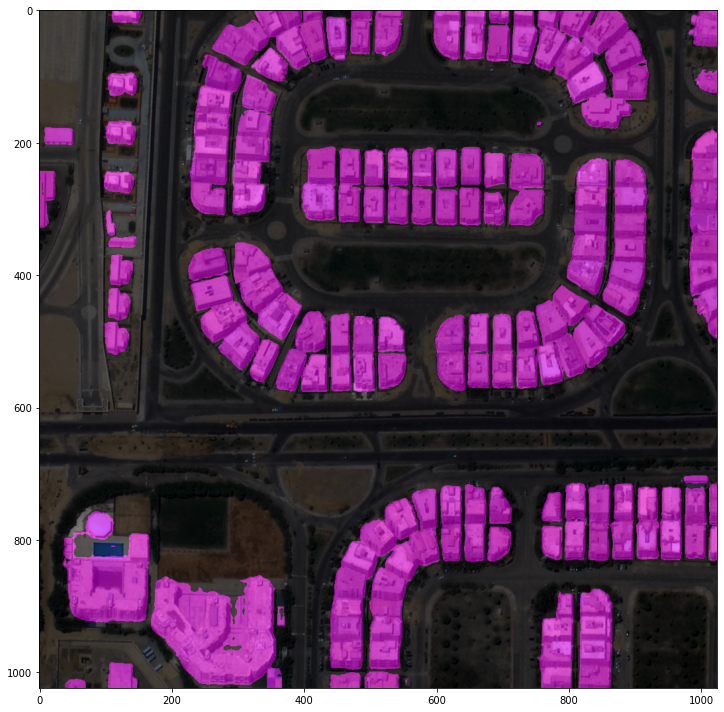

In [ ]:
model.cfg = cfg

img = mmcv.imread('/content/drive/Shareddrives/msmg/level1/dataset/validation/building/image/BLD00007_PS3_K3A_NIA0276.png')
result = inference_segmentor(model, img)
plt.figure(figsize=(10, 10))
show_result_pyplot(model, img, result, palette)

/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


<Figure size 720x720 with 0 Axes>

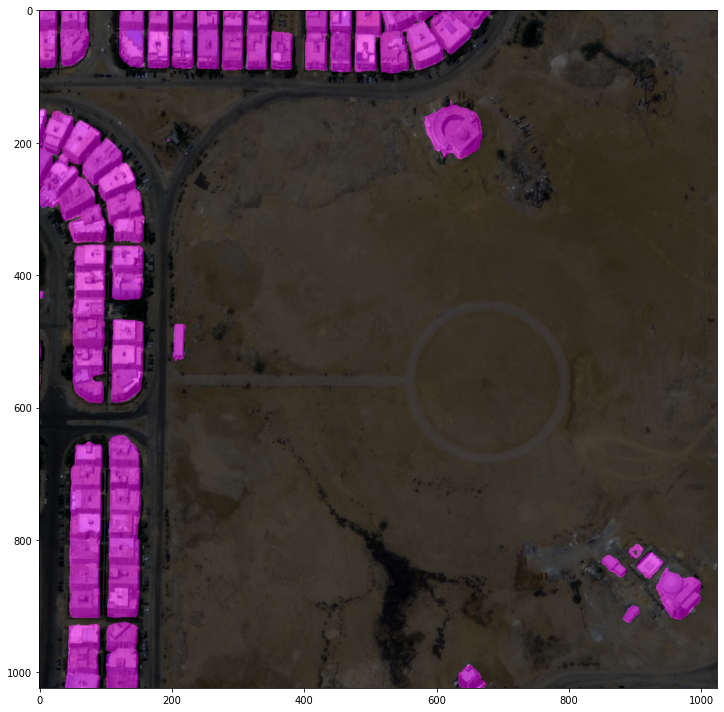

In [ ]:
img = mmcv.imread('/content/drive/Shareddrives/msmg/level1/dataset/validation/building/image/BLD00010_PS3_K3A_NIA0276.png')
result = inference_segmentor(model, img)
plt.figure(figsize=(10, 10))
show_result_pyplot(model, img, result, palette)

/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


<Figure size 720x720 with 0 Axes>

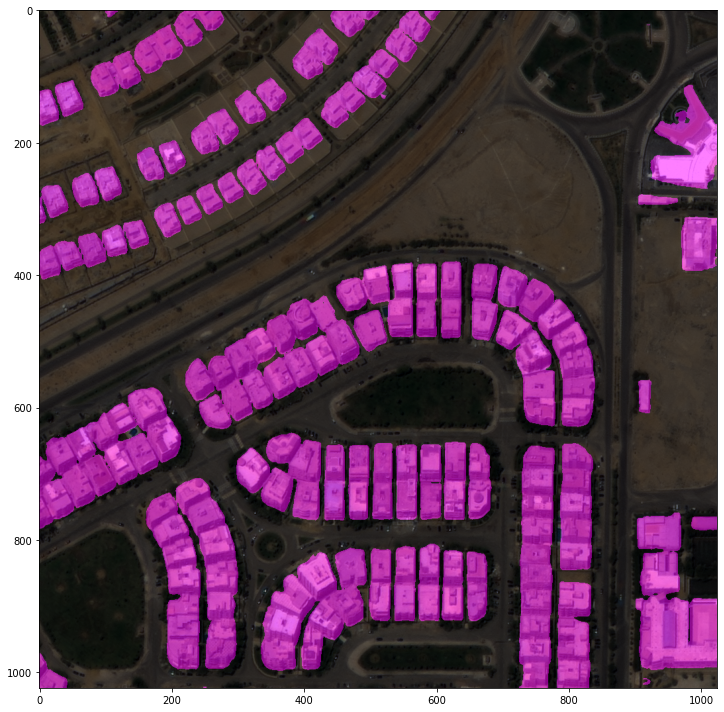

In [ ]:
img = mmcv.imread('/content/drive/Shareddrives/msmg/level1/dataset/validation/building/image/BLD00031_PS3_K3A_NIA0276.png')
result = inference_segmentor(model, img)
plt.figure(figsize=(10, 10))
show_result_pyplot(model, img, result, palette)

/content/mmsegmentation/mmseg/models/backbones/hrnet.py:318: UserWarning: DeprecationWarning: pretrained is deprecated, please use "init_cfg" instead
  warnings.warn('DeprecationWarning: pretrained is deprecated, '
/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '


load checkpoint from local path: /content/drive/Shareddrives/msmg/level1/source/building/hrnet/hrnetv2p-w48/no2_iter10000_checkpoint/iter_10000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


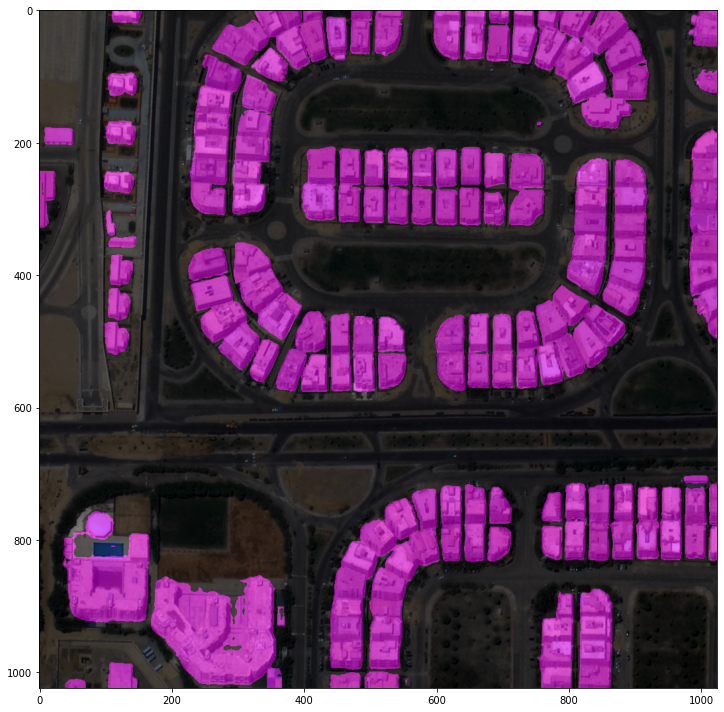

In [ ]:
checkpoint_file = '/content/drive/Shareddrives/msmg/loss test/bjh/building_hrnet_no4_iter10000_checkpoint/iter_10000.pth'  # 학습된 가중치 파일

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/Shareddrives/msmg/level1/dataset/validation/building/image/BLD00007_PS3_K3A_NIA0276.png') # inference할 이미지
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

# Inference and evaluation on the test dataset

In [ ]:
import torch, torchvision

import mmseg
from mmseg.apis import inference_segmentor, init_segmentor, show_result_pyplot
from mmseg.core.evaluation import get_palette
from mmseg.datasets.builder import DATASETS
from mmseg.datasets.custom import CustomDataset
from mmseg.apis import set_random_seed

import mmcv
from mmcv import Config

import matplotlib.pyplot as plt
import os.path as osp
import numpy as np
from PIL import Image

In [ ]:
# convert dataset annotation to semantic segmentation map
data_root = '/content/drive/Shareddrives/msmg/level1/dataset/train/building'
img_dir = 'image'
ann_dir = 'annotation'

# define class and plaette for better visualization
classes = ('background', 'building')
palette = [[0, 0, 0], [0, 0, 255]]

In [ ]:
config_file = '/content/mmsegmentation/configs/hrnet/fcn_hr48_512x512_160k_ade20k.py'
checkpoint_file = '/content/mmsegmentation/checkpoints/fcn_hr48_512x512_160k_ade20k_20200614_214407-a52fc02c.pth'
save_pth_path = '/content/drive/Shareddrives/msmg/loss test/bjh/class_ratio/building_hrnet_no10_iter10000_ratio95_checkpoint'

In [ ]:
from mmseg.apis import set_random_seed

@DATASETS.register_module(force=True)
class BuildingSemanticSegmentation(CustomDataset):
    CLASSES = classes
    PALETTE = palette
    def __init__(self, split, **kwargs):
        super().__init__(img_suffix='.png', seg_map_suffix='.png', split=split, **kwargs)
        assert osp.exists(self.img_dir) and self.split is not None

cfg = Config.fromfile(config_file)

from mmseg.apis import set_random_seed

# add CLASSES and PALETTE to checkpoint
cfg.checkpoint_config.meta = dict(
    CLASSES=classes,
    PALETTE=palette)

# Since we use only one GPU, BN is used instead of SyncBN
cfg.norm_cfg = dict(type='BN', requires_grad=True)
#cfg.model.backbone.norm_cfg = cfg.norm_cfg
cfg.model.decode_head.norm_cfg = cfg.norm_cfg
cfg.model.backbone.norm_cfg = cfg.norm_cfg
# modify num classes of the model in decode/auxiliary head
cfg.model.decode_head.num_classes = 2

# modify loss function crossentropy
# cfg.model.decode_head.loss_decode= [dict(type='CrossEntropyLoss', class_weight=[0.5, 1.0], loss_name='loss_ce', loss_weight=0.8),
# 																		dict(type='LovaszLoss', loss_type='multi_class', classes='all', per_image=True, reduction='mean', class_weight=[0.5, 1.0], loss_name='loss_lovasz', loss_weight=0.2)]

# Modify dataset type and path
cfg.dataset_type = 'BuildingSemanticSegmentation'
cfg.data_root = data_root

cfg.data.samples_per_gpu = 8
cfg.data.workers_per_gpu = 8

# Albumentations transforms settings
albu_train_transforms = [
    dict(
    type='OneOf',
    transforms=[
        dict(type='RandomRotate90', p=1.0)
    ], p=0.5),

    dict(
    type='OneOf',
    transforms=[
        dict(type='RandomBrightnessContrast',brightness_limit=0.1, contrast_limit=0.15, p=1.0),
        dict(type='CLAHE', clip_limit=4.0, tile_grid_size=(8, 8), always_apply=False, p=1.0),
        dict(type='HueSaturationValue', hue_shift_limit=15, sat_shift_limit=25, val_shift_limit=10, p=1.0),
    ], p=0.5)
]

# pipline
cfg.img_norm_cfg = dict(
    mean=[123.675, 116.28, 103.53], std=[58.395, 57.12, 57.375], to_rgb=True)
cfg.crop_size = (512, 512)
cfg.train_pipeline = [
    dict(type='LoadImageFromFile'),
    dict(type='LoadAnnotations'),
    dict(type='Resize', img_scale=(1024, 1024), ratio_range=(0.5, 1.5)),
    dict(type='RandomCrop', crop_size=cfg.crop_size, cat_max_ratio=0.75),
    dict(type='RandomFlip', flip_ratio=0.5),
    # dict(
    #     type='Albu',
    #     transforms=albu_train_transforms,
    #     keymap=dict(img='image', gt_semantic_seg='mask'),
    #     update_pad_shape=True,
    #     ),
    dict(type='PhotoMetricDistortion'),
    dict(type='Normalize', **cfg.img_norm_cfg),
    dict(type='Pad', size=cfg.crop_size, pad_val=0, seg_pad_val=255),
    dict(type='DefaultFormatBundle'),
    dict(type='Collect', keys=['img', 'gt_semantic_seg']),
]

cfg.test_pipeline = [
    dict(type='LoadImageFromFile'),
    dict(
        type='MultiScaleFlipAug',
        img_scale=(1024, 1024),
        # img_ratios=[0.5, 0.75, 1.0, 1.25, 1.5, 1.75],
        flip=False,
        transforms=[
            dict(type='Resize', keep_ratio=True),
            dict(type='RandomFlip'),
            dict(type='Normalize', **cfg.img_norm_cfg),
            dict(type='ImageToTensor', keys=['img']),
            dict(type='Collect', keys=['img']),
        ])
]

cfg.data.train.type = cfg.dataset_type
cfg.data.train.data_root = '/content/drive/Shareddrives/msmg/level1/dataset/train/building/'
cfg.data.train.img_dir = 'image'
cfg.data.train.ann_dir = 'annotation'
cfg.data.train.pipeline = cfg.train_pipeline
cfg.data.train.split = 'split/train_ratio95.txt'

cfg.data.val.type = cfg.dataset_type
cfg.data.val.data_root = '/content/drive/Shareddrives/msmg/level1/dataset/validation/building/'
cfg.data.val.img_dir = 'image'
cfg.data.val.ann_dir = 'annotation'
cfg.data.val.pipeline = cfg.test_pipeline
cfg.data.val.split = 'split/validation.txt'

cfg.data.test.type = cfg.dataset_type
cfg.data.test.data_root = '/content/drive/Shareddrives/msmg/level1/dataset/validation/building/'
cfg.data.test.img_dir = 'image'
cfg.data.test.ann_dir = 'annotation'
cfg.data.test.pipeline = cfg.test_pipeline
cfg.data.test.split = 'split/validation.txt'

# We can still use the pre-trained Mask RCNN model though we do not need to
# use the mask branch
cfg.load_from = checkpoint_file

# Set up working dir to save files and logs.
cfg.work_dir = save_pth_path

cfg.runner.max_iters = 10000
cfg.log_config.interval = 10
cfg.evaluation.interval = 100
cfg.evaluation.save_best = 'mIoU'
cfg.checkpoint_config.interval = 2000

# Set seed to facitate reproducing the result
cfg.seed = 0
set_random_seed(0, deterministic=False)
cfg.gpu_ids = range(1)

# We can also use tensorboard to log the training process
cfg.log_config.hooks = [
    dict(type='TextLoggerHook'),
    dict(type='TensorboardLoggerHook')]

# Let's have a look at the final config used for training
print(f'Config:\n{cfg.pretty_text}')

Config:
norm_cfg = dict(type='BN', requires_grad=True)
model = dict(
    type='EncoderDecoder',
    pretrained='open-mmlab://msra/hrnetv2_w48',
    backbone=dict(
        type='HRNet',
        norm_cfg=dict(type='BN', requires_grad=True),
        norm_eval=False,
        extra=dict(
            stage1=dict(
                num_modules=1,
                num_branches=1,
                block='BOTTLENECK',
                num_blocks=(4, ),
                num_channels=(64, )),
            stage2=dict(
                num_modules=1,
                num_branches=2,
                block='BASIC',
                num_blocks=(4, 4),
                num_channels=(48, 96)),
            stage3=dict(
                num_modules=4,
                num_branches=3,
                block='BASIC',
                num_blocks=(4, 4, 4),
                num_channels=(48, 96, 192)),
            stage4=dict(
                num_modules=3,
                num_branches=4,
                block='BASIC',
     

/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '


load checkpoint from local path: /content/drive/Shareddrives/msmg/loss test/bjh/class_ratio/building_hrnet_no10_iter10000_ratio95_checkpoint/best_mIoU_iter_9700.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


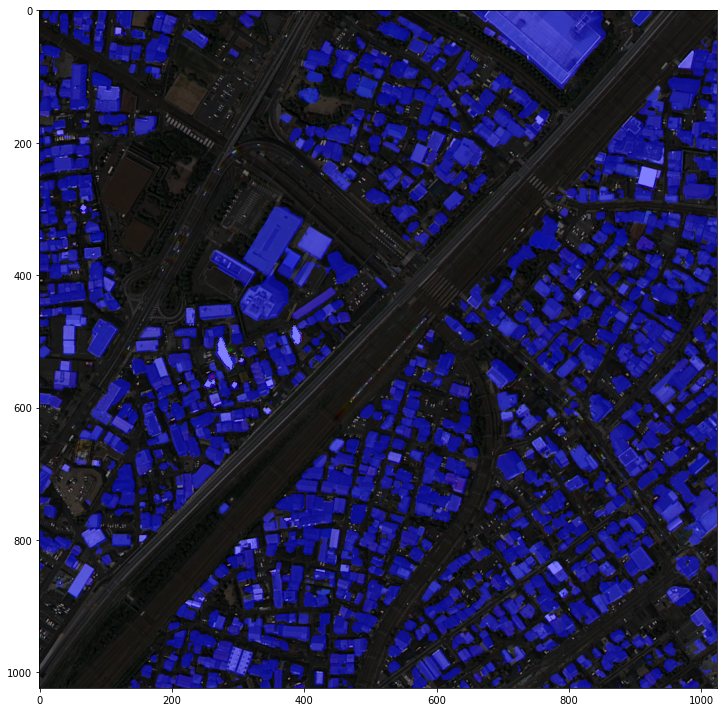

In [ ]:
checkpoint_file = '/content/drive/Shareddrives/msmg/loss test/bjh/class_ratio/building_hrnet_no10_iter10000_ratio95_checkpoint/best_mIoU_iter_9700.pth'  # 학습된 가중치 파일

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/Shareddrives/msmg/level1/dataset/validation/building/image/OBJ00352_PS3_K3_NIA0083.png') # inference할 이미지
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

In [ ]:
from mmseg.datasets import (build_dataloader, build_dataset)

# test용 Dataset과 DataLoader 생성. 
# build_dataset()호출 시 list로 감싸지 않는 것이 train용 dataset 생성시와 차이. 
dataset = build_dataset(cfg.data.test)
data_loader = build_dataloader(
        dataset,
        # 반드시 아래 samples_per_gpu 인자값은 1로 설정
        #samples_per_gpu=cfg.data.samples_per_gpu,
        #workers_per_gpu=cfg.data.workers_per_gpu,
        samples_per_gpu=1,
        workers_per_gpu=1,
        dist=False,
        shuffle=False)

2022-06-06 20:09:39,600 - mmseg - INFO - Loaded 159 images


In [ ]:
from mmseg.apis import multi_gpu_test, single_gpu_test
from mmcv.parallel import MMDataParallel, MMDistributedDataParallel
#from mmseg.apis import inference_detector, init_detector, show_result_pyplot

model_ckpt = MMDataParallel(model_ckpt, device_ids=[0])

In [ ]:
# single_gpu_test() 를 호출하여 test데이터 세트의 interence 수행. 반드시 batch size는 1이 되어야 함. 
# 위에서 만든 /content/show_test_output 디렉토리에 interence 결과가 시각화된 이미지가 저장됨. 
outputs = single_gpu_test(model_ckpt, data_loader, False, '/content/test', 0.9)

[                                                  ] 0/159, elapsed: 0s, ETA:

/content/mmsegmentation/mmseg/apis/test.py:69: UserWarning: DeprecationWarning: ``efficient_test`` will be deprecated, the evaluation is CPU memory friendly with pre_eval=True
  'DeprecationWarning: ``efficient_test`` will be deprecated, the '


[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 159/159, 1.9 task/s, elapsed: 85s, ETA:     0s

In [ ]:
metric = dataset.evaluate(outputs, metric='mIoU')
print(metric)

per class results:

+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 93.82 | 96.92 |
|  building  |  83.7 | 90.84 |
+------------+-------+-------+
Summary:

+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 95.31 | 88.76 | 93.88 |
+-------+-------+-------+
{'aAcc': 0.9531000000000001, 'mIoU': 0.8876000000000001, 'mAcc': 0.9388, 'IoU.background': 0.9381999999999999, 'IoU.building': 0.8370000000000001, 'Acc.background': 0.9692000000000001, 'Acc.building': 0.9084}
